# Preamble

## import

In [1]:
import os
import ipdb
import warnings

import numpy as np
from scipy.linalg import block_diag

import nengo
from nengo.utils.matplotlib import rasterplot
from nengo.params import Default, NumberParam
from nengo.dists import Uniform
from nengo.neurons import *
from nengo.builder.neurons import *
from nengo.dists import Uniform
from nengo.solvers import LstsqL2, NoSolver
from nengo.base import ObjView
from nengo.builder import Builder, Operator, Signal
from nengo.exceptions import BuildError
from nengo.builder.connection import build_decoders, BuiltConnection
from nengo.utils.builder import full_transform

from nengolib.signal import s, z, nrmse, LinearSystem
from nengolib.synapses import Highpass, Lowpass

import matplotlib.pyplot as plt
import seaborn as sns

sns.set(palette='colorblind', style='whitegrid')
%matplotlib inline

import neuron
neuron.h.load_file('./NEURON/durstewitz/durstewitz.hoc')
neuron.h.load_file('stdrun.hoc')

	1 


1.0

# Neuron Types

## Adaptive LIF

In [2]:
class AdaptiveLIFT(LIFRate):
    
    '''
    Aaron Voelker
    https://github.com/nengo/nengo/issues/1423
    '''
    
    probeable = ('spikes', 'voltage', 'refractory_time', 'threshold')

    min_voltage = NumberParam('min_voltage', high=0)
    tau_adapt = NumberParam('tau_adapt', low=0)
    inc_adapt = NumberParam('inc_adapt', low=0)

    def __init__(self, tau_rc=0.02, tau_ref=0.002, min_voltage=0,
                 amplitude=1, tau_adapt=0.1, inc_adapt=0.05):
        super(AdaptiveLIFT, self).__init__(
            tau_rc=tau_rc, tau_ref=tau_ref, amplitude=amplitude)
        self.min_voltage = min_voltage
        self.tau_adapt = tau_adapt
        self.inc_adapt = inc_adapt
        
    def rates(self, x, gain, bias):
        """Estimates steady-state firing rate given gain and bias."""
        J = self.current(x, gain, bias)
        voltage = np.zeros_like(gain)
        refractory_time = np.zeros_like(gain)
        threshold = np.ones_like(gain)

        return settled_firingrate(
            self.step_math, J, [voltage, refractory_time, threshold],
            dt=0.001, settle_time=0.3, sim_time=1.0)
    
    def gain_bias(self, max_rates, intercepts):
        return NeuronType.gain_bias(self, max_rates, intercepts)

    def max_rates_intercepts(self, gain, bias):
        return NeuronType.max_rates_intercepts(self, gain, bias)

    def step_math(self, dt, J, spiked, voltage, refractory_time, threshold):
        # reduce all refractory times by dt
        refractory_time -= dt

        # compute effective dt for each neuron, based on remaining time.
        # note that refractory times that have completed midway into this
        # timestep will be given a partial timestep, and moreover these will
        # be subtracted to zero at the next timestep (or reset by a spike)
        delta_t = (dt - refractory_time).clip(0, dt)

        # update voltage using discretized lowpass filter
        # since v(t) = v(0) + (J - v(0))*(1 - exp(-t/tau)) assuming
        # J is constant over the interval [t, t + dt)
        voltage -= (J - voltage) * np.expm1(-delta_t / self.tau_rc)

        # determine which neurons spiked (set them to 1/dt, else 0)
        spiked_mask = voltage > threshold
        spiked[:] = spiked_mask * (self.amplitude / dt)

        # set v(0) = threshold and solve for t to compute the spike time
        # TODO: not sure if this mask is the right way to handle log domain errors
        threshold_spiked = threshold[spiked_mask]
        m = (voltage[spiked_mask] - threshold_spiked) / (J[spiked_mask] - threshold_spiked)
        t_spike = np.zeros_like(m)
        t_spike[m < 1] = dt + self.tau_rc * np.log1p(-m[m < 1])

        # update threshold using discretized lowpass filter
        # applied to the input 1 + spiked * inc_adapt 
        threshold -= ((1 + self.inc_adapt * spiked - threshold) *
                      np.expm1(-dt / self.tau_adapt))
        
        # set spiked voltages to zero, refractory times to tau_ref, and
        # rectify negative voltages to a floor of min_voltage
        voltage[voltage < self.min_voltage] = self.min_voltage
        voltage[spiked_mask] = 0
        refractory_time[spiked_mask] = self.tau_ref + t_spike


@Builder.register(AdaptiveLIFT)
def build_alift(model, lif, neurons):
    model.sig[neurons]['voltage'] = Signal(
        np.zeros(neurons.size_in), name="%s.voltage" % neurons)
    model.sig[neurons]['refractory_time'] = Signal(
        np.zeros(neurons.size_in), name="%s.refractory_time" % neurons)
    model.sig[neurons]['threshold'] = Signal(
        np.ones(neurons.size_in), name="%s.threshold" % neurons)
    model.add_op(SimNeurons(
        neurons=lif,
        J=model.sig[neurons]['in'],
        output=model.sig[neurons]['out'],
        states=[model.sig[neurons]['voltage'],
                model.sig[neurons]['refractory_time'],
                model.sig[neurons]['threshold']]))

## Wilson Neuron

In [3]:
class WilsonRK4(NeuronType):

    probeable = ('spikes', 'voltage', 'recovery', 'conductance')
    threshold = NumberParam('threshold')
    tau_V = NumberParam('tau_V')
    tau_R = NumberParam('tau_R')
    tau_H = NumberParam('tau_H')
    
    _v0 = -0.754  # initial voltage
    _r0 = 0.279  # initial recovery
    _maxJ = 2.0  # clip input current at this maximum to avoid catastrophic shutdown
    
    def __init__(self, threshold=-0.20, tau_V=0.00097, tau_R=0.0056, tau_H=0.0990):
        super(WilsonRK4, self).__init__()
        self.threshold = threshold
        self.tau_V = tau_V
        self.tau_R = tau_R
        self.tau_H = tau_H
        
        # TODO(arvoelke): Try replacing this solver with something like
        # http://www2.gsu.edu/~matrhc/PyDSTool.htm
        # The main consideration is that we need a callback to count spikes
        from scipy.integrate import ode
        self.solver = ode(self._ode_fun).set_integrator(
            'dopri5', first_step=0.00005, nsteps=100,
            rtol=1e-2, atol=1e-3)  # runge-kutta method of order (4)5
        
    def rates(self, x, gain, bias):
        """Estimates steady-state firing rate given gain and bias."""
        J = self.current(x, gain, bias)
        voltage = self._v0*np.ones_like(J)
        recovery = self._r0*np.ones_like(J)
        conductance = np.zeros_like(J)

        return settled_firingrate(
            self.step_math, J, [voltage, recovery, conductance],
            dt=0.001, settle_time=0.1, sim_time=1.0)

    def _ode_fun(self, dummy_t, y, J):  # first argument to scipy.integrate.ode
        V, R, H = np.split(y, 3)
        dV = (-(17.81 + 47.58*V + 33.80*np.square(V))*(V - 0.48) -
              26*R*(V + 0.95) - 13*H*(V + 0.95) + J)
        dR = -R + 1.29*V + 0.79 + 3.30*np.square(V + 0.38)
        dH = -H + 11*(V + 0.754)*(V + 0.69)
        return np.concatenate((
            dV / self.tau_V, dR / self.tau_R, dH / self.tau_H))

    def step_math(self, dt, J, spiked, V, R, H):
        # It's a little silly to be reinitializing the solver on
        # every time-step, but any other ways that I could think of would 
        # violate the nengo builder's assumption that the neuron's state is
        # encapsulated by the signals in SimNeurons
        self.solver.set_initial_value(np.concatenate((V, R, H)))
        self.solver.set_f_params(J.clip(max=self._maxJ))
        
        spiked[:] = 0
        AP = V > self.threshold
        def spike_detector(dummy_t, y):  # callback for each sub-step
            V_t = y[:len(V)] > self.threshold
            spiked[:] += V_t & (~AP)  # note the "+="
            AP[:] = V_t
        self.solver.set_solout(spike_detector)

        V[:], R[:], H[:] = np.split(self.solver.integrate(self.solver.t + dt), 3)
        if not self.solver.successful():
            raise ValueError("ODE solver failed with status code: %d" % (
                self.solver.get_return_code()))
        spiked[:] /= dt

        return spiked, V, R, H


@Builder.register(WilsonRK4)
def build_wilsonneuron(model, neuron_type, neurons):
    model.sig[neurons]['voltage'] = Signal(
        neuron_type._v0*np.ones(neurons.size_in), name="%s.voltage" % neurons)
    model.sig[neurons]['recovery'] = Signal(
        neuron_type._r0*np.ones(neurons.size_in), name="%s.recovery" % neurons)
    model.sig[neurons]['conductance'] = Signal(
        np.zeros(neurons.size_in), name="%s.conductance" % neurons)
    model.add_op(SimNeurons(
        neurons=neuron_type,
        J=model.sig[neurons]['in'],
        output=model.sig[neurons]['out'],
        states=[model.sig[neurons]['voltage'],
                model.sig[neurons]['recovery'],
                model.sig[neurons]['conductance']]))

## Durstewitz Neuron

In [4]:
class DurstewitzNeuron(NeuronType):
    
    probeable = ('spikes', 'voltage')

    def __init__(self, v0=-65.0, dt_neuron=0.025, DA=False, k_weight=1, conn_opt=False):
        super(DurstewitzNeuron, self).__init__()
        self.v0 = v0
        self.dt_neuron = dt_neuron
        self.DA = DA  # dopaminergic modulation ON/OFF
        self.k_weight = k_weight
        self.conn_opt = conn_opt

    def neuron_rates(self, wgain, wbias, x, n_neurons_test, stage, dt=0.001, tau=0.1, max_rate_pre=20):
        rate_pos = (max_rate_pre/2) * (x + 1)
        rate_neg = (max_rate_pre/2) * (-x + 1)
        spike_counts = np.zeros_like(n_neurons_test)
        neurons = []
        spk_vecs = []
        spk_recs = []
        stims = []
        syns = []
        ncs = []
        for n in range(n_neurons_test):
            neurons.append(neuron.h.Durstewitz())
            neurons[n].init()
            spk_vecs.append(neuron.h.Vector())
            spk_recs.append(neuron.h.APCount(neurons[n].soma(0.5)))
            spk_recs[n].record(neuron.h.ref(spk_vecs[n]), dt*1000)
            for loc in [neurons[n].basal(0.5), neurons[n].prox(0.5), neurons[n].dist(0.5)]:
                if stage == 'gain':
                    # bias spikes
                    stims.append(neuron.h.NetStim())
                    syns.append(neuron.h.ExpSyn(loc))
                    syns[-1].tau = tau * 1000
                    syns[-1].e = -70 if wbias < 0 else 0
                    ncs.append(neuron.h.NetCon(stims[-1], syns[-1], 0, 0, np.abs(wbias)))
                    ncs[-1].pre().interval = 1
                    ncs[-1].pre().start = 0
                    ncs[-1].pre().number = 1e10
                    ncs[-1].pre().noise = 0
                    w = wgain[n]
                    # positive encoder presynaptic neuron
                    stims.append(neuron.h.NetStim())
                    syns.append(neuron.h.ExpSyn(loc))
                    syns[-1].tau = tau * 1000
                    syns[-1].e = 0
                    ncs.append(neuron.h.NetCon(stims[-1], syns[-1], 0, 0, w))
                    ncs[-1].pre().interval = 1000.0 / rate_pos
                    ncs[-1].pre().start = 0
                    ncs[-1].pre().number = 1e10
                    ncs[-1].pre().noise = 0
                    # negative encoder presynaptic neuron
                    if rate_neg <= 0: continue
                    stims.append(neuron.h.NetStim())
                    syns.append(neuron.h.ExpSyn(loc))
                    syns[-1].tau = tau * 1000
                    syns[-1].e = -70
                    ncs.append(neuron.h.NetCon(stims[-1], syns[-1], 0, 0, w))
                    ncs[-1].pre().interval = 1000.0 / rate_neg
                    ncs[-1].pre().start = 0
                    ncs[-1].pre().number = 1e10
                    ncs[-1].pre().noise = 0
                elif stage == 'bias':
                    # bias spikes
                    stims.append(neuron.h.NetStim())
                    syns.append(neuron.h.ExpSyn(loc))
                    syns[-1].tau = tau * 1000
                    syns[-1].e = -70 if wbias[n] < 0 else 0
                    ncs.append(neuron.h.NetCon(stims[-1], syns[-1], 0, 0, np.abs(wbias[n])))
                    ncs[-1].pre().start = 0
                    ncs[-1].pre().number = 1e10
                    ncs[-1].pre().noise = 0
                    ncs[-1].pre().interval = 1
                    # positive encoder presynaptic neuron
                    stims.append(neuron.h.NetStim())
                    syns.append(neuron.h.ExpSyn(loc))
                    syns[-1].tau = tau * 1000
                    syns[-1].e = 0
                    ncs.append(neuron.h.NetCon(stims[-1], syns[-1], 0, 0, wgain))
                    ncs[-1].pre().interval = 1000.0 / rate_pos
                    ncs[-1].pre().start = 0
                    ncs[-1].pre().number = 1e10
                    ncs[-1].pre().noise = 0
                    # negative encoder presynaptic neuron
                    if rate_neg <= 0: continue
                    stims.append(neuron.h.NetStim())
                    syns.append(neuron.h.ExpSyn(loc))
                    syns[-1].tau = tau * 1000
                    syns[-1].e = -70
                    ncs.append(neuron.h.NetCon(stims[-1], syns[-1], 0, 0, wgain))
                    ncs[-1].pre().interval = 1000.0 / rate_neg
                    ncs[-1].pre().start = 0
                    ncs[-1].pre().number = 1e10
                    ncs[-1].pre().noise = 0
        settle_time = 0.1
        sim_time = 1.0
        neuron.h.tstop = (settle_time+sim_time)*1000
        neuron.h.dt = self.dt_neuron
        neuron.h.run()
        spike_counts = [np.where(np.array(sts) > settle_time*1000)[0].shape[0] for sts in spk_vecs]
        for n in range(n_neurons_test):
            spk_vecs[n].play_remove()
            del(neurons[0])
        rates = np.array(spike_counts)/sim_time
        return rates
        
    def gain_bias(self, max_rates, intercepts,
            attempts=20, steps=10, y_thr=3, x_thr=1, delta_gain=1e-4, delta_bias=5e-6):
        print('finding gain and bias assuming on/off spiking inputs...')
        max_rates = np.array(max_rates, dtype=float, copy=False, ndmin=1)
        intercepts = np.array(intercepts, dtype=float, copy=False, ndmin=1)
#         print('max_rates', max_rates)
#         print('intercepts', intercepts)
        n_neurons = max_rates.shape[0]
        gain = np.zeros((n_neurons))
        bias = np.zeros((n_neurons))
        for n in range(n_neurons):
            wgain_min = 0.0
            wgain_max = 1e-3
            wbias_min = -3e-6
            wbias_max = 3e-6
            gain_pass = False
            bias_pass = False
            min_x_int = 1e10
            max_delta = 0
            gain_best = 1e-10
            bias_best = 1e-10
#             print('target y-int', max_rates[n])
#             print('target x-int', intercepts[n])
            for a in range(attempts):
                if a == 0:
                    wbias = 0
                '''find wgain that achieve max_rates[n] at x=1 given previous wbias'''
                if not gain_pass:
                    wgain = np.linspace(wgain_min, wgain_max, steps)
                    y_rates = self.neuron_rates(wgain, wbias, x=1, n_neurons_test=steps, stage='gain')
#                     print('wgain', wgain)
#                     print('y_rates', y_rates)
                    wgain = wgain[np.argmin(np.abs(y_rates - max_rates[n]))]
                    y_int = y_rates[np.argmin(np.abs(y_rates - max_rates[n]))]
                else:
                    y_int = self.neuron_rates([wgain], wbias, x=1, n_neurons_test=1, stage='gain')
                '''find wbias that achieve 0<hz<1 at x=intercept[n] given previous wgain'''
                if not bias_pass:
                    wbias = np.linspace(wbias_min, wbias_max, steps)
                    x_rates = self.neuron_rates(wgain, wbias, x=intercepts[n], n_neurons_test=steps, stage='bias')
#                     print('wbias', wbias)
                    if (x_rates > x_thr).all() or (x_rates <= 0).all():
                        wbias = wbias[0]
                        x_int = x_rates[0]
                    else:
                        wbias = wbias[np.where(x_rates <= x_thr)[0][-1]]
                        x_int = x_rates[np.where(x_rates <= x_thr)[0][-1]]
                else:
                    x_int = self.neuron_rates(wgain, [wbias], x=intercepts[n], n_neurons_test=1, stage='bias')
                a_y_int = self.neuron_rates([wgain], wbias, x=1, n_neurons_test=1, stage='gain')
                a_x_int = self.neuron_rates(wgain, [wbias], x=intercepts[n], n_neurons_test=1, stage='bias')
#                 print('attempt %s' %a)
#                 print('rate at y-int', a_y_int)
#                 print('rate at x-int', a_x_int)
                if 0 < a_x_int <= min_x_int:
                    min_x_int = a_x_int
                    if a_y_int-a_x_int > max_delta:
                        max_delta = a_y_int-a_x_int
                        gain_best = wgain
                        bias_best = wbias
                if a_x_int > a_y_int:  # oversaturated
                    wgain_max -= 3*delta_gain
                    wbias_min -= 3*delta_bias
                    wbias_max -= 3*delta_bias
                if np.abs(a_y_int - max_rates[n]) <= y_thr:
                    gain_pass = True
                elif a_y_int < max_rates[n] - y_thr:
                    wgain_min += delta_gain/2
                    wgain_max += delta_gain
                    gain_pass = False
                elif a_y_int > max_rates[n] + y_thr:
                    wgain_min -= delta_gain
                    wgain_max -= delta_gain/2
                    gain_pass = False
                if 0 < a_x_int <= x_thr:
                    bias_pass = True
                elif a_x_int > x_thr:
                    wbias_min -= delta_bias
                    wbias_max -= delta_bias/2
                    bias_pass = False
                elif a_x_int <= 0:
                    wbias_min += delta_bias/2
                    wbias_max += delta_bias
                    bias_pass = False
                if gain_pass and bias_pass:
                    print('optimized neuron %s' %n)
                    gain[n] = wgain
                    bias[n] = wbias
                    break
                if a == attempts-1:
                    print('did not find good gain/bias for neuron %s' %n)
                    # use the highest rate / largest intercept found during optimization instead
                    gain[n] = gain_best
                    bias[n] = bias_best
            final_rate_y_int = self.neuron_rates([wgain], wbias, x=1, n_neurons_test=1, stage='gain')
            final_rate_x_int = self.neuron_rates(wgain, [wbias], x=intercepts[n], n_neurons_test=1, stage='bias')
#             print('final rate y int', final_rate_y_int)
#             print('final rate x int', final_rate_x_int)
#         self.gain = gain
#         self.bias = bias
#         self.max_rates = max_rates
#         self.intercepts = intercepts
#         print('gain', gain)
#         print('bias', bias)
        return gain, bias
        
    def max_rates_intercepts(self, gain, bias, xsteps=21):
        """Measure firing rate at each eval_point using neuron_rates, estimate x_int and rate at y_int"""
#         return self.max_rates, self.intercepts
        print('estimating max_rates and intercepts from provided gain/bias...')
        n_neurons = gain.shape[0]
        xs = np.linspace(-1, 1, xsteps)
        rates = np.zeros((xsteps, n_neurons))
        for x in range(xsteps):
            for n in range(n_neurons):
                rates[x, n] = self.neuron_rates([gain[n]], bias[n], xs[x], 1, 'gain')
        max_rates = rates[-1]
        intercepts = np.zeros((n_neurons))
        for n in range(n_neurons):
            if (rates[:,n] <= 0).all():
                warnings.warn("neuron %s not firing in max_rates_intercepts" %n)
                intercepts[n] = 0
            else:    
                intercepts[n] = xs[np.where(rates[:,n] > 0)[0][0]]
        print('max rates', max_rates)
        print('intercepts', intercepts)
#         self.max_rates = max_rates
#         self.intercepts = intercepts
        return max_rates, intercepts
    
    def step_math(self, v_recs, spk_vecs, spk_recs, spk_before, voltage, spiked, time, dt):
        n_neurons = voltage.shape[0]
#         spk_before = np.array([np.array(spk_vecs[n]) for n in range(n_neurons)])
        if neuron.h.t < time*1000:  # Nengo starts at t=dt
            neuron.h.tstop = time*1000
            neuron.h.continuerun(neuron.h.tstop)
        for n in range(n_neurons):
            if not np.isfinite(v_recs[n][-1]):
#                 warnings.warn('neuron %s returned nan voltage at t=%s' %(n, neuron.h.t*1000))
                voltage[n] = 0
            else:
                voltage[n] = v_recs[n][-1]
#         voltage[:] = np.array([v[-1] for v in v_recs])  # .clip(-100, 60)            
        spk_after = [list(spk_vecs[n]) for n in range(n_neurons)]
        for n in range(n_neurons):
            spiked[n] = (len(spk_after[n]) - len(spk_before[n])) / dt
            spk_before[n] = list(spk_after[n])
        # check if neurons have spent more than 10% of time in bad voltage range over last 100 ms
#         for v in v_recs:
#             if len(v) > 100:
#                 volts_above = np.where(np.array(v)[-100:] > -20)[0]
#                 volts_below = np.where(np.array(v)[-100:] < -10)[0]
#                 volts_bad = np.intersect1d(volts_above, volts_below)
#                 ratio = len(volts_bad) / 100
#                 if ratio > 0.1:
#                     warnings.warn('neuron %s is oversaturated'%n)
        
@Builder.register(DurstewitzNeuron)
def build_neuronneuron(model, neuron_type, neurons):
    cells = [neuron.h.Durstewitz() for n in range(neurons.size_in)]
    model.sig[neurons]['voltage'] = Signal(
        neuron_type.v0*np.ones(neurons.size_in), name="%s.voltage"%neurons)
    neuronop = SimNeuronNeurons(
        neuron_type=neuron_type,
        neurons=cells,
        J=model.sig[neurons]['in'],
        output=model.sig[neurons]['out'],
        states=[model.time, model.sig[neurons]['voltage']],
        dt=model.dt)
    model.params[neurons] = cells
    model.add_op(neuronop)
    
class SimNeuronNeurons(Operator):
    def __init__(self, neuron_type, neurons, J, output, states, dt):
        super(SimNeuronNeurons, self).__init__()
        self.neuron_type = neuron_type
        self.neurons = neurons
        self.reads = [states[0], J]
        self.sets = [output, states[1]]
        self.updates = []
        self.incs = []
        self.v_recs = []
        self.spk_vecs = []
        self.spk_recs = []
        self.spk_before = [[] for n in range(len(neurons))]
        for n in range(len(neurons)):
            if self.neuron_type.DA:
                self.neurons[n].init_DA()
            else:
                self.neurons[n].init()
            self.v_recs.append(neuron.h.Vector())
            self.v_recs[n].record(self.neurons[n].soma(0.5)._ref_v, dt*1000)
            self.spk_vecs.append(neuron.h.Vector())
            self.spk_recs.append(neuron.h.APCount(self.neurons[n].soma(0.5)))
            self.spk_recs[n].record(neuron.h.ref(self.spk_vecs[n]), dt*1000)
        neuron.h.dt = self.neuron_type.dt_neuron
        neuron.h.tstop = 0
    def make_step(self, signals, dt, rng):
        J = signals[self.current]
        output = signals[self.output]
        voltage = signals[self.voltage]
        time = signals[self.time]
        def step_nrn():
            self.neuron_type.step_math(
                self.v_recs, self.spk_vecs, self.spk_recs, self.spk_before,
                voltage, output, time, dt)
        return step_nrn
    @property
    def time(self):
        return self.reads[0]
    @property
    def current(self):
        return self.reads[1]
    @property
    def output(self):
        return self.sets[0]
    @property
    def voltage(self):
        return self.sets[1]

class TransmitSpikes(Operator):
    def __init__(self, neurons, synapses, weights, spikes, states, dt):
        super(TransmitSpikes, self).__init__()
        self.neurons = neurons
        self.synapses = synapses
        self.dt = dt
        self.weights = weights
        self.time = states[0]
        self.reads = [spikes, states[0]]
        self.updates = []
        self.sets = []
        self.incs = []
        
#         self.netcons = np.zeros((1,1), dtype=list)
#         self.stim = neuron.h.NetStim()
#         self.syn = neuron.h.ExpSyn(self.neurons[0].soma(0.5))
#         self.syn.tau = 100
#         self.netcons[0,0] = [neuron.h.NetCon(None, self.syn, 0, 0, 1e-3)]
        
        self.netcons = np.zeros((self.weights.shape), dtype=list)
        for pre in range(self.synapses.shape[0]):
            for post in range(self.synapses.shape[1]):
                # NetCon(source, target, threshold, delay, weight)
                self.netcons[pre, post] = []
                for compt in range(len(self.synapses[pre, post])):
                    syn = self.synapses[pre, post][compt]
                    w = np.abs(self.weights[pre, post])
                    nc = neuron.h.NetCon(None, syn, 0, 0, w)
                    self.netcons[pre, post].append(nc)
    def make_step(self, signals, dt, rng):
        spikes = signals[self.spikes]
        time = signals[self.time]
        def step():
            t_neuron = time.item()*1000
#             if int(t_neuron) % 10 == 0:
#                 for nc in self.netcons[0,0]:
#                     nc.event(t_neuron)
#                 for pre in range(spikes.shape[0]):
#                     for post in range(len(self.neurons)):
#                         for nc in self.netcons[pre, post]:
#                             nc.event(t_neuron)

            for pre in range(spikes.shape[0]):
                if spikes[pre] > 0:
#                 if int(t_neuron) % 10 == 0:
                    for post in range(len(self.neurons)):
                        for nc in self.netcons[pre, post]:
                            nc.event(t_neuron)
        return step

    @property
    def spikes(self):
        return self.reads[0]
    
class BiasSpikes(Operator):
    def __init__(self, neurons, bias):
        super(BiasSpikes, self).__init__()
        self.neurons = neurons
        self.tau = 0.1
        self.bias = bias
        self.reads = []
        self.updates = []
        self.sets = []
        self.incs = []
        self.stims = []
        self.syns = []
        self.ncs = []
        for n in range(len(self.neurons)):
            for loc in [neurons[n].basal(0.5), neurons[n].prox(0.5), neurons[n].dist(0.5)]:
                self.stims.append(neuron.h.NetStim())
                self.syns.append(neuron.h.ExpSyn(loc))
                self.syns[-1].tau = self.tau * 1000  # time constant of synapse on spiking bias input
                self.syns[-1].e = 0.0 if self.bias[n] > 0 else -70.0
                self.ncs.append(neuron.h.NetCon(self.stims[-1], self.syns[-1], 0, 0, np.abs(self.bias[n])))
                self.ncs[-1].pre().start = 0
                self.ncs[-1].pre().number = 1e10
                self.ncs[-1].pre().interval = 1
                self.ncs[-1].pre().noise = 0  # 0 for regular spikes at rate, 1 for poisson spikes at rate
    def make_step(self, signals, dt, rng):
        def step():
            pass
        return step

def neuron_rates_conn(wconn, wbias, taus, rates_pre, n_neurons_test, stage, tau_bias=0.1, noise=0):
    spike_counts = np.zeros_like(n_neurons_test)
    neurons = []
    spk_vecs = []
    spk_recs = []
    stims = []
    syns = []
    ncs = []
    for n in range(n_neurons_test):
        neurons.append(neuron.h.Durstewitz())
        neurons[n].init()
        spk_vecs.append(neuron.h.Vector())
        spk_recs.append(neuron.h.APCount(neurons[n].soma(0.5)))
        spk_recs[n].record(neuron.h.ref(spk_vecs[n]), dt*1000)
        for loc in [neurons[n].basal(0.5), neurons[n].prox(0.5), neurons[n].dist(0.5)]:
            if stage == 'gain':
                # bias spikes
                stims.append(neuron.h.NetStim())
                syns.append(neuron.h.ExpSyn(loc))
                syns[-1].tau = tau_bias * 1000
                syns[-1].e = -70 if wbias < 0 else 0
                ncs.append(neuron.h.NetCon(stims[-1], syns[-1], 0, 0, np.abs(wbias)))
                ncs[-1].pre().interval = 1
                ncs[-1].pre().start = 0
                ncs[-1].pre().number = 1e10
                ncs[-1].pre().noise = 0
                for pre in range(wconn.shape[0]):
                    if rates_pre[pre] <= 0: continue
                    w = wconn[pre, n]
                    stims.append(neuron.h.NetStim())
                    syns.append(neuron.h.ExpSyn(loc))
                    if len(taus) == 1:
                        syns[-1] = neuron.h.ExpSyn(loc)
                        syns[-1].tau = taus[0]*1000
                    elif len(taus) == 2:
                        syns[-1] = neuron.h.Exp2Syn(loc)
                        syns[-1].tau1 = np.min(taus)*1000
                        syns[-1].tau2 = np.max(taus)*1000
                    syns[-1].e = -70 if w <= 0 else 0
                    ncs.append(neuron.h.NetCon(stims[-1], syns[-1], 0, 0, np.abs(w)))
                    ncs[-1].pre().interval = 1000.0 / rates_pre[pre]
                    ncs[-1].pre().start = 0
                    ncs[-1].pre().number = 1e10
                    ncs[-1].pre().noise = noise
            elif stage == 'bias':
                # bias spikes
                stims.append(neuron.h.NetStim())
                syns.append(neuron.h.ExpSyn(loc))
                syns[-1].tau = tau_bias * 1000
                syns[-1].e = -70 if wbias[n] < 0 else 0
                ncs.append(neuron.h.NetCon(stims[-1], syns[-1], 0, 0, np.abs(wbias[n])))
                ncs[-1].pre().start = 0
                ncs[-1].pre().number = 1e10
                ncs[-1].pre().noise = 0
                ncs[-1].pre().interval = 1
                for pre in range(wconn.shape[0]):
                    if rates_pre[pre] <= 0: continue
                    w = wconn[pre, 0]
                    stims.append(neuron.h.NetStim())
                    syns.append(neuron.h.ExpSyn(loc))
                    if len(taus) == 1:
                        syns[-1] = neuron.h.ExpSyn(loc)
                        syns[-1].tau = taus[0]*1000
                    elif len(taus) == 2:
                        syns[-1] = neuron.h.Exp2Syn(loc)
                        syns[-1].tau1 = np.min(taus)*1000
                        syns[-1].tau2 = np.max(taus)*1000
                    syns[-1].e = -70 if w <= 0 else 0
                    ncs.append(neuron.h.NetCon(stims[-1], syns[-1], 0, 0, np.abs(w)))
                    ncs[-1].pre().interval = 1000.0 / rates_pre[pre]
                    ncs[-1].pre().start = 0
                    ncs[-1].pre().number = 1e10
                    ncs[-1].pre().noise = noise
    settle_time = 0.1
    sim_time = 1.0
    neuron.h.tstop = (settle_time+sim_time)*1000
    neuron.h.dt = 0.025
    neuron.h.run()
    spike_counts = [np.where(np.array(sts) > settle_time*1000)[0].shape[0] for sts in spk_vecs]
    for n in range(n_neurons_test):
        spk_vecs[n].play_remove()
        del(neurons[0])
    rates = np.array(spike_counts)/sim_time
    return rates

def gain_bias_conn(encoders_pre, gain_pre, bias_pre, encoders, gain0, bias0, max_rates, intercepts,
        d_pre, taus, k_weight, 
        attempts=30, steps=10, y_thr=3, x_thr=1, delta_gain=1e-4, delta_bias=5e-6):
    print('finding gain and bias given connection details...')
    max_rates = np.array(max_rates, dtype=float, copy=False, ndmin=1)
    intercepts = np.array(intercepts, dtype=float, copy=False, ndmin=1)
    n_neurons = encoders.shape[0]
    n_neurons_pre = encoders_pre.shape[0]
    gain = np.zeros((n_neurons))
    bias = np.zeros((n_neurons))
    delta_gain *= k_weight
    x_pre_x_int = np.dot(intercepts.reshape((n_neurons, 1)), encoders_pre.T)
    x_pre_y_int = np.dot(encoders.reshape((n_neurons, 1)), encoders_pre.T)
    rates_pre_x_int = nengo.LIF().rates(x_pre_x_int, gain_pre, bias_pre) # radius?
    rates_pre_y_int = nengo.LIF().rates(x_pre_y_int, gain_pre, bias_pre)
    for n in range(n_neurons):
#         wgain_min = 0.0
#         wgain_max = 1e-2
#         wbias_min = -3e-5
#         wbias_max = 3e-5
        wgain_min = 0.9*gain0[n] * k_weight
        wgain_max = 1.1*gain0[n] * k_weight
        wbias_min = bias0[n]
        wbias_max = bias0[n]
        gain_pass = False
        bias_pass = False
        min_x_int = 1e10
        max_delta = 0
        gain_best = 1e-10
        bias_best = 1e-10
        print('target y-int', max_rates[n])
        print('target x-int', intercepts[n])
        for a in range(attempts):
            if a == 0:
                wbias = bias0[n]
            '''find wgain that achieve max_rates[n] at x=1 given previous wbias'''
            if not gain_pass:
                wgain = np.linspace(wgain_min, wgain_max, steps)
                scaled_enc = (encoders[n] * wgain).reshape((1, steps))
                wconn = np.dot(d_pre.T, scaled_enc)
                y_rates = neuron_rates_conn(wconn, wbias, taus,
                    rates_pre=rates_pre_y_int[n], n_neurons_test=steps, stage='gain')
                print('y_rates', y_rates)
                wgain = wgain[np.argmin(np.abs(y_rates - max_rates[n]))]
                y_int = y_rates[np.argmin(np.abs(y_rates - max_rates[n]))]
            else:
                scaled_enc = (encoders[n] * wgain).reshape((1, 1))
                wconn = np.dot(d_pre.T, scaled_enc)
                y_int = neuron_rates_conn(wconn, wbias, taus,
                    rates_pre=rates_pre_y_int[n], n_neurons_test=1, stage='gain')
            '''find wbias that achieve 0<hz<1 at x=intercept[n] given previous wgain'''
            if not bias_pass:
                scaled_enc = (encoders[n] * wgain).reshape((1, 1))
                wconn = np.dot(d_pre.T, scaled_enc)
                wbias = np.linspace(wbias_min, wbias_max, steps)
                x_rates = neuron_rates_conn(wconn, wbias, taus,
                    rates_pre=rates_pre_x_int[n], n_neurons_test=steps, stage='bias')
                print('x_rates', x_rates)
                if (x_rates > x_thr).all() or (x_rates <= 0).all():
                    wbias = wbias[0]
                    x_int = x_rates[0]
                else:
                    wbias = wbias[np.where(x_rates <= x_thr)[0][-1]]
                    x_int = x_rates[np.where(x_rates <= x_thr)[0][-1]]
            else:
                x_int = neuron_rates_conn(wconn, [wbias], taus,
                    rates_pre=rates_pre_x_int[n], n_neurons_test=1, stage='bias')                 
            scaled_enc = (encoders[n] * wgain).reshape((1, 1))
            wconn = np.dot(d_pre.T, scaled_enc)
            a_y_int = neuron_rates_conn(wconn, wbias, taus,
                rates_pre=rates_pre_y_int[n], n_neurons_test=1, stage='gain')
            a_x_int = neuron_rates_conn(wconn, [wbias], taus,
                rates_pre=rates_pre_x_int[n], n_neurons_test=1, stage='bias')
            print('attempt %s' %a)
            print('rate at y-int', a_y_int)
            print('rate at x-int', a_x_int)
            if 0 < a_x_int <= min_x_int:
                min_x_int = a_x_int
                if a_y_int-a_x_int > max_delta:
                    max_delta = a_y_int-a_x_int
                    gain_best = wgain
                    bias_best = wbias
            if a_x_int > a_y_int:  # oversaturated
                wgain_max -= 3*delta_gain
                wbias_min -= 3*delta_bias
                wbias_max -= 3*delta_bias
            if np.abs(a_y_int - max_rates[n]) <= y_thr:
                gain_pass = True
            elif a_y_int < max_rates[n] - y_thr:
                wgain_min += delta_gain/2
                wgain_max += delta_gain
                gain_pass = False
            elif a_y_int > max_rates[n] + y_thr:
                wgain_min -= delta_gain
                wgain_max -= delta_gain/2
                gain_pass = False
            if 0 < a_x_int <= x_thr:
                bias_pass = True
            elif a_x_int > x_thr:
                wbias_min -= delta_bias
                wbias_max -= delta_bias/2
                bias_pass = False
            elif a_x_int <= 0:
                wbias_min += delta_bias/2
                wbias_max += delta_bias
                bias_pass = False
            if gain_pass and bias_pass:
                print('optimized neuron %s' %n)
                gain[n] = wgain
                bias[n] = wbias
                break
            if a == attempts-1:
                print('did not find good gain/bias for neuron %s' %n)
                # use the highest rate / largest intercept found during optimization instead
                gain[n] = gain_best
                bias[n] = bias_best
        scaled_enc = (encoders[n] * wgain).reshape((1, 1))
        wconn = np.dot(d_pre.T, scaled_enc)
        final_rate_y_int = neuron_rates_conn(wconn, wbias, taus,
            rates_pre=rates_pre_y_int[n], n_neurons_test=1, stage='gain')
        final_rate_x_int = neuron_rates_conn(wconn, [wbias], taus,
            rates_pre=rates_pre_x_int[n], n_neurons_test=1, stage='bias')
#             print('final rate y int', final_rate_y_int)
#             print('final rate x int', final_rate_x_int)
    return gain, bias

@Builder.register(nengo.Connection)
def build_connection(model, conn):
    rng = np.random.RandomState(model.seeds[conn])
    if isinstance(conn.post_obj, nengo.Ensemble) and isinstance(conn.post_obj.neuron_type, DurstewitzNeuron):
        assert isinstance(conn.pre_obj, nengo.Ensemble), "only presynaptic neurons supported"
        assert 'spikes' in conn.pre_obj.neuron_type.probeable, "only spiking neurons supported"
        assert isinstance(conn.synapse, LinearSystem), "only nengolib synapses supported"
        assert len(conn.synapse.num) == 0, "only poles supported"
        # optimize gain/bias with spiking inputs using attributes of conn.pre_obj and conn
        print('building ', conn)
        taus = -1.0/np.array(conn.synapse.poles)
        neurons = model.params[conn.post_obj.neurons]
        model.sig[conn]['in'] = model.sig[conn.pre_obj]['out']
        transform = full_transform(conn, slice_pre=False)
        eval_points, d, solver_info = model.build(conn.solver, conn, rng, transform)
        encoders = model.params[conn.post_obj].encoders
        if not conn.post_obj.neuron_type.conn_opt or np.sum(np.abs(d)) <= 0:
            bias = model.params[conn.post_obj].bias
            gain = np.array(model.params[conn.post_obj].gain.reshape((len(neurons), 1)))
            gain /= np.sum(np.max(taus)*np.exp(-np.arange(0.001, 1, 0.001)/np.max(taus)))
#             gain /= model.params[conn.post_obj].max_rates
            gain *= conn.post_obj.neuron_type.k_weight
                 
        elif hasattr(conn, 'gain') and np.sum(conn.gain) > 0:
            gain = conn.gain.reshape((len(neurons), 1))
            bias = conn.bias          
        else:
            gain, bias = gain_bias_conn(
                model.params[conn.pre_obj].encoders,
                model.params[conn.pre_obj].gain,
                model.params[conn.pre_obj].bias,
                model.params[conn.post_obj].encoders,
                model.params[conn.post_obj].gain,
                model.params[conn.post_obj].bias,
                model.params[conn.post_obj].max_rates,
                model.params[conn.post_obj].intercepts,
                d/transform, 
                taus,
                conn.post_obj.neuron_type.k_weight)
            conn.gain = gain
            conn.bias = bias
            gain = gain.reshape((len(neurons), 1))
        if not hasattr(conn.post_obj, 'biasspike'):
            model.add_op(BiasSpikes(neurons, bias))
            conn.post_obj.biasspike = True
        scaled_enc = encoders * gain
        weights = np.dot(d.T, scaled_enc.T)
#         print('weights', weights)
        synapses = np.zeros((weights.shape), dtype=list)
        for pre in range(synapses.shape[0]):
            for post in range(synapses.shape[1]):
                synapses[pre, post] = []
                for loc in [neurons[post].basal(0.5), neurons[post].prox(0.5), neurons[post].dist(0.5)]:
                    if len(taus) == 1:
                        syn = neuron.h.ExpSyn(loc)
                        syn.tau = taus[0]*1000
                    elif len(taus) == 2:
                        syn = neuron.h.Exp2Syn(loc)
                        syn.tau1 = np.min(taus)*1000
                        syn.tau2 = np.max(taus)*1000
                    syn.e = 0.0 if weights[pre, post] > 0 else -70.0
                    synapses[pre, post].append(syn)

        model.add_op(TransmitSpikes(neurons, synapses, weights,
            model.sig[conn.pre_obj]['out'], states=[model.time], dt=model.dt))
        model.params[conn] = BuiltConnection(
            eval_points=eval_points, solver_info=solver_info, transform=transform, weights=d)
    else:
        return nengo.builder.connection.build_connection(model, conn)

/home/pduggins/nengo/nengo/builder/builder.py:234: UserWarning: Type '<class 'nengo.connection.Connection'>' already has a builder. Overwriting.
  % nengo_class)


# Network

In [5]:
def norms(freq, seed, t, dt=0.001):
    with nengo.Network() as model:
        stim = nengo.Node(nengo.processes.WhiteSignal(period=t/2, high=freq, rms=1, seed=seed))
        p_stimulus = nengo.Probe(stim, synapse=None)
        p_integral = nengo.Probe(stim, synapse=1/s)
    with nengo.Simulator(model, progress_bar=False, dt=dt) as sim:
        sim.run(t, progress_bar=False)
    norm_stim = np.max(np.abs(sim.data[p_stimulus]))
    norm_int = np.max(np.abs(sim.data[p_integral]))
    return norm_stim, norm_int

In [6]:
def simulate(  
    d_fb,
    h,
    t=1,
    dt=0.001,
    dt_sample=0.001,
    n_neurons=100,
    n_neurons_pre=100,
    freq=1,
    taus={'network': 0.1, 'readout': 0.1},
    seeds={'ns': 1, 'ss':2, 'es': 3, 'cs': 4, 'ls': 5},
    supv=1,
    neuron_type=nengo.LIF(),
    gain=Default,
    bias=Default,
    max_rates=Default,
    intercepts=Default,
    **kwargs):
    
    # transform input signal u so that the integral x is normalized to np.max(np.abs(x))==1
    norm_stim, norm_int = norms(freq, seeds['ss'], t, dt=dt)
    
    # Simulate the full network
    with nengo.Network(seed=seeds['ns']) as model:

        # Nodes
        model.T = t
        def flip(t, x):
            if t<model.T/2: return x
            elif t>=model.T/2: return -1.0*x
        u_raw = nengo.Node(nengo.processes.WhiteSignal(period=model.T/2, high=freq, rms=1, seed=seeds['ss']))
        u = nengo.Node(output=flip, size_in=1)
    
        # Ensembles
        pre_u = nengo.Ensemble(n_neurons_pre, 1, max_rates=Uniform(20, 20),
            seed=seeds['es'], radius=norm_stim, label='pre_u')
        pre_x = nengo.Ensemble(n_neurons_pre, 1, max_rates=Uniform(20, 20),
            seed=seeds['es'], radius=1, label='pre_x')
        fb = nengo.Ensemble(n_neurons, 1,
            gain=gain, bias=bias, max_rates=max_rates, intercepts=intercepts,
            neuron_type=neuron_type, seed=seeds['es'], label='fb')
        lif = nengo.Ensemble(n_neurons, 1, max_rates=max_rates, intercepts=intercepts,
            neuron_type=nengo.LIF(), seed=seeds['es'], label='lif')
        tar = nengo.Ensemble(1, 1, neuron_type=nengo.Direct())

        # normal connections
        nengo.Connection(u_raw, u, synapse=None, seed=seeds['cs'])
        nengo.Connection(u, pre_u, synapse=None, transform=1.0/norm_int, seed=seeds['cs'])
        nengo.Connection(u, pre_x, synapse=1/s, transform=1.0/norm_int, seed=seeds['cs'])
        nengo.Connection(u, tar, synapse=1/s, transform=1.0/norm_int)
        nengo.Connection(pre_u, lif, synapse=taus['network'], transform=taus['network'])
        nengo.Connection(lif, lif, synapse=taus['network'])
        
        # bioneuron connections
        nengo.Connection(pre_u, fb, synapse=Lowpass(taus['network']),
            transform=taus['network'], seed=seeds['cs'])
        nengo.Connection(pre_x, fb, synapse=Lowpass(taus['network']),
            transform=supv, seed=seeds['cs'])
        nengo.Connection(fb, fb, synapse=h,
            transform=1-supv, solver=NoSolver(d_fb), seed=seeds['cs'])

        # probes
        p_stim = nengo.Probe(u, synapse=None, sample_every=dt)
        p_target = nengo.Probe(tar, synapse=None, sample_every=dt)
        p_spk_pre_u = nengo.Probe(pre_u.neurons, synapse=None, sample_every=dt)
        p_spk_pre_x = nengo.Probe(pre_x.neurons, synapse=None, sample_every=dt)
        p_spk_fb = nengo.Probe(fb.neurons, synapse=None, sample_every=dt)
        p_spk_lif = nengo.Probe(lif.neurons, synapse=None, sample_every=dt)
        p_lif = nengo.Probe(lif, synapse=taus['readout'], sample_every=dt)
        p_volt = nengo.Probe(fb.neurons, 'voltage', synapse=None, sample_every=dt)
        

    # Run the simulation
    with nengo.Simulator(model, seed=seeds['ss'], dt=dt, progress_bar=True) as sim:
        sim.run(t, progress_bar=True)
        
    return dict(
        trange=sim.trange(sample_every=dt),
        stim=1.0/norm_int*sim.data[p_stim],
        tar=sim.data[p_target],
        spk_pre_u=sim.data[p_spk_pre_u],
        spk_pre_x=sim.data[p_spk_pre_x],
        spk_fb=sim.data[p_spk_fb],
        spk_lif=sim.data[p_spk_lif],
        volt=sim.data[p_volt],
        x_lif=sim.data[p_lif],
        gain=sim.data[fb].gain,
        bias=sim.data[fb].bias,
        max_rates=sim.data[fb].max_rates,
        intercepts=sim.data[fb].intercepts)

# Decoder and Filter Updates

In [7]:
def update_d(target_data, spk_data, h, **kwargs):
    lpf = Lowpass(kwargs['taus']['readout'])
    target = lpf.filt(target_data, dt=kwargs['dt'], y0=0)
    A = h.filt(spk_data, dt=kwargs['dt'], y0=0)
    d_new = LstsqL2(reg=kwargs['lambda_d'])(A, target)[0]
    return d_new

In [8]:
def update_h(stim_data, target_data, spk_data, min_d=-1e-2, max_d=1e-2,
        mean_taus=[0.1], std_taus=[0.025], min_tau=0.001, max_tau=1.0, **kwargs):

    def sample_prior(n_samples, order, mean_taus, std_taus, min_tau=1e-4, rng=np.random.RandomState(seed=0)):
        """Return n samples (taus) from the prior of a k'th-order synapse."""
        taus = np.zeros((n_samples, order))
        for o in range(order):
            taus[:, o] = rng.normal(mean_taus[o], std_taus[o], size=(n_samples, )).clip(min_tau)
        return taus
    
    lambda_c = kwargs['lambda_c']
    lambda_d = kwargs['lambda_d']
    for att in range(10):  # attempts
        order = kwargs['order']
        n_samples = kwargs['n_samples']
        assert len(mean_taus) == order
        assert len(std_taus) == order
        taus = sample_prior(n_samples, order, mean_taus, std_taus)

        poles = -1. / taus
        n_steps = spk_data.shape[0]
        n_neurons = spk_data.shape[1]
        assert poles.shape == (n_samples, order)

        tf_params = np.zeros((n_samples, order))
        for i in range(n_samples):
            sys = LinearSystem(([], poles[i, :], 1 / np.prod(taus[i, :])))   # (zeros, poles, gain)
            assert len(sys) == order
            assert np.allclose(sys.dcgain, 1)
            den_normalized = np.asarray(sys.den / sys.num[0])
            assert len(den_normalized) == order + 1
            assert np.allclose(den_normalized[-1], 1)  # since normalized
            # tf_params ordered from lowest to highest, ignoring c_0 = 1, i.e., [c_1, ..., c_k]
            tf_params[i, :] = den_normalized[:-1][::-1]

        # We assume c_i are independent by setting the off-diagonals to zero
        C = np.cov(tf_params, rowvar=False)
        if order == 1:
            C = C*np.eye(1)
        Q = np.linalg.inv(C)
        c0 = np.mean(tf_params, axis=0)
        d0 = np.ones((n_neurons, ))
        cd0 = np.hstack((c0, d0))
        assert Q.shape == (order, order)
        assert cd0.shape == (order+n_neurons,)

        diff = (1. - ~z) / kwargs['dt']
        A = np.zeros((n_steps, order + n_neurons))
        deriv_n = target_data
        for i in range(order):
            deriv_n = diff.filt(deriv_n, y0=0, dt=kwargs['dt'])
            A[:, i] = deriv_n.ravel()  # todo: D>1
        for n in range(n_neurons):
            A[:, order+n] = spk_data[:, n]
        b = kwargs['taus']['network']  # set on pre_u ==> supv connection in network
        Y = (b*stim_data - target_data)
        smoother = Lowpass(kwargs['taus']['readout'])
        A = smoother.filt(A, y0=0, dt=kwargs['dt'], axis=0)
        Y = smoother.filt(Y, y0=0, dt=kwargs['dt'])

        # construct block diagonal matrix with different regularizations for filter coefficients and decoders
        L = block_diag(lambda_c*Q, lambda_d*np.eye(n_neurons))
        gamma = A.T.dot(A) + L
        upsilon = A.T.dot(Y) + L.dot(cd0).reshape((order+n_neurons, 1))  # optional term with tikhonov regularization

        cd = np.linalg.inv(gamma).dot(upsilon).ravel()
        c_new = cd[:order]
        d_new = -1.*cd[-n_neurons:]
        assert c_new.shape==(order,)
        assert d_new.shape==(n_neurons,)
        print('taus attempt %s, nonzero d %s: '%(att, np.count_nonzero(d_new+1)), c_new)
        for n in range(n_neurons):
            if d_new[n] > max_d or d_new[n] < min_d:
                d_new[n] = 0
        d_new = d_new.reshape((n_neurons, 1))
        h_new = 1. / (1 + sum(c_new[i] * s**(i+1) for i in range(order)))
        assert np.allclose(h_new.dcgain, 1)
        if np.all(c_new > 0):
            break
        else:
            mean_taus[-1] *= 2
            lambda_c *= 2
            lambda_d *= 2

    return h_new, d_new

# Plotting

In [9]:
def bin_activities_values_1d(
    xhat_pre,
    act_bio,
    x_min=-1,
    x_max=1,
    n_neurons=10,
    n_eval_points=20):

    def find_nearest(array,value):
        idx = (np.abs(array-value)).argmin()
        return idx

    x_bins = np.linspace(x_min, x_max, num=n_eval_points)
    hz_means = np.empty((n_neurons, n_eval_points))
    hz_stds = np.empty((n_neurons, n_eval_points))
    for i in range(n_neurons):
        bin_act = [[] for _ in range(x_bins.shape[0])]
        for t in range(act_bio.shape[0]):
            idx = find_nearest(x_bins, xhat_pre[t])
            bin_act[idx].append(act_bio[t, i])
        for x in range(len(bin_act)):
            hz_means[i, x] = np.average(bin_act[x])
            hz_stds[i, x] = np.std(bin_act[x])

    return x_bins, hz_means, hz_stds

In [10]:
def get_nrmse(datadict, d_fb, h, **kwargs):
    dt = kwargs['dt']
    lpf = Lowpass(kwargs['taus']['readout'])
    A_lif = lpf.filt(datadict['spk_lif'], dt=dt, y0=0)
    A_fb = h.filt(datadict['spk_fb'], dt=dt, y0=0)
    target = lpf.filt(datadict['tar'], dt=dt, y0=0)
    xhat_lif = datadict['x_lif']
    nrmse_lif = nrmse(xhat_lif, target=target)
    xhat_fb = np.dot(A_fb, d_fb)
    nrmse_fb = nrmse(xhat_fb, target=target)
    return nrmse_lif, nrmse_fb

In [11]:
def make_plots(datadict, d_fb, h,
        plot_tuning=False, plot_filter=False, plot_estimate=False, plot_hist=False, plot_volt=False,
        neurons_per_plot=10, y_max=20, **kwargs):

    dt = kwargs['dt']
    dt_sample = kwargs['dt_sample']
    n_neurons = kwargs['n_neurons']
    taus = kwargs['taus']
    lpf = Lowpass(taus['readout'])
    A_lif = lpf.filt(datadict['spk_lif'], dt=dt, y0=0)[::int(dt_sample/dt)]
    A_fb = h.filt(datadict['spk_fb'], dt=dt, y0=0)[::int(dt_sample/dt)]
    target = lpf.filt(datadict['tar'], dt=dt, y0=0)[::int(dt_sample/dt)]
    times = dt_sample * np.arange(0, len(target), 1)
    cmap = sns.color_palette('hls', neurons_per_plot)

    if plot_filter:
        impulse_time = np.arange(0, 1, 0.001)
        fig, ax = plt.subplots(1, 1, figsize=(8, 4))
        ax.plot(impulse_time, lpf.impulse(len(impulse_time)), label='lowpass')
        ax.plot(impulse_time, h.impulse(len(impulse_time)), label='optimized')
        ax.set(xlabel='time (s)', ylabel='amplitude')
        ax.legend()
        plt.tight_layout()
        plt.show()

    if plot_tuning:
        print('nonzero fb', np.count_nonzero(np.sum(datadict['spk_fb'], axis=0)))
        x_bins_lif, hz_means_lif, hz_stds_lif = bin_activities_values_1d(
            target, A_lif, n_neurons=n_neurons)
        x_bins_fb, hz_means_fb, hz_stds_fb = bin_activities_values_1d(
            target, A_fb, n_neurons=n_neurons)
#         y_max = kwargs['max_rates'].high
        for sp in range(int(n_neurons/neurons_per_plot)):
            fig, axes = plt.subplots(1, 2, figsize=(8, 4), sharey=True, sharex=True)
            idx0 = sp*neurons_per_plot
            idx1 = (sp+1)*neurons_per_plot
            a_error_fb = np.average(np.abs(A_fb[:,idx0:idx1] - A_lif[:,idx0:idx1]))
            for n in range(neurons_per_plot):
                axes[0].plot(x_bins_lif, hz_means_lif[idx0+n], c=cmap[n])
                axes[0].fill_between(x_bins_lif,
                    hz_means_lif[idx0+n]+hz_stds_lif[idx0+n],
                    hz_means_lif[idx0+n]-hz_stds_lif[idx0+n],
                    alpha=0.5, facecolor=cmap[n])
                axes[1].plot(x_bins_fb, hz_means_fb[idx0+n], c=cmap[n])
                axes[1].fill_between(x_bins_fb,
                    hz_means_fb[idx0+n]+hz_stds_fb[idx0+n],
                    hz_means_fb[idx0+n]-hz_stds_fb[idx0+n],
                    alpha=0.5, facecolor=cmap[n])
            if sp == 0:
                axes[0].set(xlim=((-1,1)), ylim=((0, y_max)),
                    ylabel='activity (Hz)', title='lif')  # \n neuron %s to %s'%(idx0, idx1)
                axes[1].set(xlim=((-1,1)), ylim=((0, y_max)),title="fb")  #  \n %s \n a_error=%.3f
#                     %(str(kwargs['neuron_type']).split("(")[0], a_error_fb))
            elif sp == int(n_neurons/neurons_per_plot)-1:
                axes[0].set(xlim=((-1,1)), ylim=((0, y_max)), xlabel='$\mathbf{x}$',
                    ylabel='neuron %s to %s'%(idx0, idx1), title='lif')
                axes[1].set(xlim=((-1,1)), ylim=((0, y_max)), xlabel='$\mathbf{x}$',
                    title="a_error=%.3f" %a_error_fb)                
            else:
                axes[0].set(xlim=((-1,1)), ylim=((0, y_max)),
                    ylabel='neuron %s to %s'%(idx0, idx1), title='lif')
                axes[1].set(xlim=((-1,1)), ylim=((0, y_max)),
                    title="a_error=%.3f" %a_error_fb)                
            plt.tight_layout()

    if plot_estimate:
        xhat_lif = datadict['x_lif'][::int(dt_sample/dt)]
        nrmse_lif = nrmse(xhat_lif, target=target)
        xhat_fb = np.dot(A_fb, d_fb)
        nrmse_fb = nrmse(xhat_fb, target=target)
        fig, ax = plt.subplots(1, 1, figsize=(8, 4))
        ax.plot(times, target, label='target', linestyle='--')
        ax.plot(times, xhat_lif, label='lif, nrmse=%.3f' %nrmse_lif)
        ax.plot(times, xhat_fb, label='fb, %s, nrmse=%.3f'
            %(str(kwargs['neuron_type']).split("(")[0], nrmse_fb))
        ax.set(xlabel='time (seconds)', ylabel='$f(\mathbf{x}, t)$')
        ax.legend(loc='lower left')
        plt.tight_layout()
        plt.show()
        
    if plot_hist:
        fig, ax = plt.subplots(1, 1, figsize=(8, 4))
        sns.distplot(d_fb, ax=ax)
        ax.set(xlabel='feedback decoder', ylabel='frequency')
        plt.show()
        
    if plot_volt:
        for sp in range(int(n_neurons/3)):
            idx0 = sp*3
            idx1 = (sp+1)*3
            fig, ax = plt.subplots(1, 1, figsize=(8, 4))
            ax.plot(times, datadict['volt'][:, idx0:idx1])
            ax.set(xlabel='time', ylabel='voltage')
            plt.show()

In [12]:
def plot_estimate_raster(datadict, d_fb, h, n_spikes=20, **kwargs):
    from nengo_extras.plot_spikes import plot_spikes, preprocess_spikes
    dt = kwargs['dt']
    dt_sample = kwargs['dt_sample']
    n_neurons = kwargs['n_neurons']
    taus = kwargs['taus']
    lpf = Lowpass(taus['readout'])
    spk_fb = datadict['spk_fb']
    A_fb = h.filt(datadict['spk_fb'], dt=dt, y0=0)[::int(dt_sample/dt)]
    target = lpf.filt(datadict['tar'], dt=dt, y0=0)[::int(dt_sample/dt)]
    times = dt_sample * np.arange(0, len(target), 1)
    xhat_fb = np.dot(A_fb, d_fb)
    nrmse_fb = nrmse(xhat_fb, target=target)
    spk = preprocess_spikes(datadict['trange'], datadict['spk_fb'], num=n_spikes)
    sns.set(palette='colorblind', style='white')

    fig, ax = plt.subplots(1, 1, figsize=(8, 4))
    ax.plot(times, n_spikes/2 + n_spikes/2*xhat_fb, label='bioneuron')
    ax.plot(times, n_spikes/2 + n_spikes/2*target, label='target', linestyle='--')
    ax.set(yticks=([]), xlim=((times[0]-0.1, times[-1]+0.1)), xlabel='time (seconds)',
        ylim=((-1, n_spikes+1)), ylabel='$f(\mathbf{x}, t)$',
        title='NRMSE=%.3f'%nrmse_fb)
    plot_spikes(spk[0], spk[1], ax=ax)
#     rasterplot(datadict['trange'], datadict['spk_fb'], ax=ax)
    ax.legend(loc='lower left')
    plt.tight_layout()
    plt.show()

# plot_estimate_raster(datadict_fb, d_fb, h, **kwargs)

In [13]:
def plot_filter_dist(d_fb, h, **kwargs):
    impulse_time = np.arange(0, 1, 0.001)
    taus = -1.0 / h.poles
    fig, (ax, ax2) = plt.subplots(1, 2, figsize=(8, 4))
    ax.plot(impulse_time, h.impulse(len(impulse_time)))
    ax.set(xlabel='time (s)', ylabel='amplitude', title=r"$\tau_{rise}=%.3f$, $\tau_{decay}=%.3f$" %(taus[0], taus[1]))
    sns.distplot(d_fb, ax=ax2, label='fb')
    ax2.set(xlabel=r"$\mathbf{d^{fb}}$", ylabel='frequency')
    plt.tight_layout()
    plt.show()

# plot_filter_dist(d_fb, h, **kwargs)

In [14]:
def plot_bargraphs(nrmses):
    fig, ax = plt.subplots(1, 1, figsize=(8, 6))
    sns.barplot(data=nrmses)
    ax.set(ylabel='NRMSE')  # xlabel='neuron_type', 
#     plt.xticks(np.arange(4), ('LIF', 'ALIF', 'Wilson', 'Durstewitz'))
    plt.xticks(np.arange(5), ('LIF', 'ALIF', 'Wilson', 'Durstewitz', 'Dopamine'))
    plt.show()
    
# plot_bargraphs(nrmses)

In [15]:
def plot_read(n_trials):
    neuron_types = [
        nengo.LIF(),
        AdaptiveLIFT(tau_adapt=0.1, inc_adapt=0.1),
        WilsonRK4(),
        DurstewitzNeuron(dt_neuron=0.025, DA=False),
#         DurstewitzNeuron(dt_neuron=0.025, DA=True),
    ]
    nrmses = np.zeros((n_trials, len(neuron_types)))
    for nt, neuron_type in enumerate(neuron_types):
        for j in range(n_trials):
            fname = "/home/pduggins/nengo_bioneurons/nengo_bioneurons/tests/data/durstewitz_integrator/test_%s_%s.npz"%(nt, j)
            nrmses[j, nt] = np.load(fname)['nrmse']
    plot_bargraphs(nrmses)
    return nrmses

# Run Control

In [16]:
def run_once(optimize_h=True, **kwargs):
    
    rng = np.random.RandomState(seed=kwargs['seeds']['ls'])
    d_fb = np.zeros((kwargs['n_neurons'], 1))
    h = Lowpass(kwargs['taus']['readout'])
       
    print("supervised simulation")
    datadict_train = simulate(d_fb, h, supv=1, **kwargs)
    y_max = kwargs['max_rates'].high
    kwargs['gain'] = datadict_train['gain']
    kwargs['bias'] = datadict_train['bias']
    kwargs['max_rates'] = datadict_train['max_rates']
    kwargs['intercepts'] = datadict_train['intercepts']
    
    print("least-squares optimization of recurrent filter and/or decoders")
    if optimize_h:
        h, d_fb = update_h(datadict_train['stim'], datadict_train['tar'], datadict_train['spk_fb'], **kwargs)
    else:
        d_fb = update_d(datadict_train['tar'], datadict_train['spk_fb'], h, **kwargs)
    make_plots(datadict_train, d_fb, h, y_max=y_max,
        plot_filter=True, plot_estimate=True, plot_tuning=True, plot_hist=True, plot_volt=False, **kwargs)

    print("unsupervised simulation")
    kwargs['seeds']['ss'] = kwargs['seeds']['ss'] + 1
    datadict_test = simulate(d_fb, h, supv=0, **kwargs)
    make_plots(datadict_test, d_fb, h, y_max=y_max,
        plot_estimate=True, plot_tuning=True, plot_hist=True, plot_volt=False, **kwargs)
   
    return d_fb, h, datadict_train, datadict_test

In [17]:
def run_trials(n_trials, start=0, optimize_h=True, **kwargs):
    
    rng = np.random.RandomState(seed=kwargs['seeds']['ls'])
    d_fb = np.zeros((kwargs['n_neurons'], 1))
    h = Lowpass(kwargs['taus']['readout'])

    print("supervised simulation")
    datadict_train = simulate(d_fb, h, supv=1, **kwargs)
    
    print("least-squares optimization of recurrent filter and/or decoders")
    if optimize_h:
        h, d_fb = update_h(datadict_train['stim'], datadict_train['tar'], datadict_train['spk_fb'], **kwargs)
    else:
        d_fb = update_d(datadict_train['tar'], datadict_train['spk_fb'], h, **kwargs)

    print("testing")
    nrmses = np.zeros((n_trials))
    for j in np.arange(start, start+n_trials):
        print("trial %s" %j)
        fname = "/home/pduggins/nengo_bioneurons/nengo_bioneurons/tests/data/durstewitz_integrator/test_Durstewitz_%s.npz"%j
        kwargs['seeds']['ss'] = kwargs['seeds']['ss'] + 1
        datadict_test = simulate(d_fb, h, supv=0, **kwargs)
        nrmse_lif, nrmse_fb = get_nrmse(datadict_test, d_fb, h, **kwargs)
        np.savez(fname, tar=datadict_test['tar'], fb=datadict_test['spk_fb'], times=datadict_test['trange'], nrmse=nrmse_fb)
#         make_plots(datadict_test, d_fb, h, plot_estimates=True, **kwargs)
        nrmses[j-start] = nrmse_fb

    plot_bargraphs(nrmses)
    return nrmses

In [18]:
def run_trials_types(n_trials, start=0, optimize_h=True, **kwargs):
    
    neuron_types = [
        nengo.LIF(),
        AdaptiveLIFT(tau_adapt=0.1, inc_adapt=0.1),
        WilsonRK4(),
        DurstewitzNeuron(dt_neuron=0.025, DA=False),
        DurstewitzNeuron(dt_neuron=0.025, DA=True),
    ]
    og_dt = kwargs['dt']
    nrmses = np.zeros((n_trials, len(neuron_types)))
    
    for nt, neuron_type in enumerate(neuron_types):
        print("neuron_type = %s" %neuron_type)
        kwargs['neuron_type'] = neuron_type
        if isinstance(neuron_type, type(WilsonRK4())):
            kwargs['dt'] = 0.00025
            kwargs['dt_sample'] = 0.00025
        else:
            kwargs['dt'] = og_dt
            kwargs['dt_sample'] = og_dt
        rng = np.random.RandomState(seed=kwargs['seeds']['ls'])
        d_fb = np.zeros((kwargs['n_neurons'], 1))
        h = Lowpass(kwargs['taus']['readout'])

        print("supervised simulation")
        datadict_train = simulate(d_fb, h, supv=1, **kwargs)

        print("least-squares optimization of recurrent filter and/or decoders")
        if optimize_h:
            h, d_fb = update_h(datadict_train['stim'], datadict_train['tar'], datadict_train['spk_fb'], **kwargs)
        else:
            d_fb = update_d(datadict_train['tar'], datadict_train['spk_fb'], h, **kwargs)

        print("testing")
        for j in np.arange(start, start+n_trials):
            print("trial %s" %j)
            fname = "/home/pduggins/nengo_bioneurons/nengo_bioneurons/tests/data/durstewitz_integrator/test2_%s_%s.npz"%(nt, j)
            kwargs['seeds']['ss'] = kwargs['seeds']['ss'] + 1
            datadict_test = simulate(d_fb, h, supv=0, **kwargs)
            nrmse_lif, nrmse_fb = get_nrmse(datadict_test, d_fb, h, **kwargs)
            np.savez(fname, tar=datadict_test['tar'], fb=datadict_test['spk_fb'], tiems=datadict_test['trange'], nrmse=nrmse_fb)
            make_plots(datadict_test, d_fb, h, plot_estimates=True, **kwargs)
            nrmses[j-start, nt] = nrmse_fb

    plot_bargraphs(nrmses)
    return nrmses

# Simulations

## LIF

supervised simulation


/home/pduggins/.virtualenvs/nbn/lib/python3.6/site-packages/nengolib/signal/system.py:197: UserWarning: y0 (None!=0) does not properly initialize the system; see Nengo issue #1124.
  "Nengo issue #1124." % y0, UserWarning)
/home/pduggins/nengo/nengo/utils/numpy.py:79: FutureWarning: Using a non-tuple sequence for multidimensional indexing is deprecated; use `arr[tuple(seq)]` instead of `arr[seq]`. In the future this will be interpreted as an array index, `arr[np.array(seq)]`, which will result either in an error or a different result.
  v = a[inds]


HtmlProgressBar cannot be displayed. Please use the TerminalProgressBar. It can be enabled with `nengo.rc.set('progress', 'progress_bar', 'nengo.utils.progress.TerminalProgressBar')`.

HtmlProgressBar cannot be displayed. Please use the TerminalProgressBar. It can be enabled with `nengo.rc.set('progress', 'progress_bar', 'nengo.utils.progress.TerminalProgressBar')`.

least-squares optimization of recurrent filter and/or decoders
testing
trial 0


HtmlProgressBar cannot be displayed. Please use the TerminalProgressBar. It can be enabled with `nengo.rc.set('progress', 'progress_bar', 'nengo.utils.progress.TerminalProgressBar')`.

HtmlProgressBar cannot be displayed. Please use the TerminalProgressBar. It can be enabled with `nengo.rc.set('progress', 'progress_bar', 'nengo.utils.progress.TerminalProgressBar')`.

trial 1


HtmlProgressBar cannot be displayed. Please use the TerminalProgressBar. It can be enabled with `nengo.rc.set('progress', 'progress_bar', 'nengo.utils.progress.TerminalProgressBar')`.

HtmlProgressBar cannot be displayed. Please use the TerminalProgressBar. It can be enabled with `nengo.rc.set('progress', 'progress_bar', 'nengo.utils.progress.TerminalProgressBar')`.

trial 2


HtmlProgressBar cannot be displayed. Please use the TerminalProgressBar. It can be enabled with `nengo.rc.set('progress', 'progress_bar', 'nengo.utils.progress.TerminalProgressBar')`.

HtmlProgressBar cannot be displayed. Please use the TerminalProgressBar. It can be enabled with `nengo.rc.set('progress', 'progress_bar', 'nengo.utils.progress.TerminalProgressBar')`.

trial 3


HtmlProgressBar cannot be displayed. Please use the TerminalProgressBar. It can be enabled with `nengo.rc.set('progress', 'progress_bar', 'nengo.utils.progress.TerminalProgressBar')`.

HtmlProgressBar cannot be displayed. Please use the TerminalProgressBar. It can be enabled with `nengo.rc.set('progress', 'progress_bar', 'nengo.utils.progress.TerminalProgressBar')`.

trial 4


HtmlProgressBar cannot be displayed. Please use the TerminalProgressBar. It can be enabled with `nengo.rc.set('progress', 'progress_bar', 'nengo.utils.progress.TerminalProgressBar')`.

HtmlProgressBar cannot be displayed. Please use the TerminalProgressBar. It can be enabled with `nengo.rc.set('progress', 'progress_bar', 'nengo.utils.progress.TerminalProgressBar')`.

trial 5


HtmlProgressBar cannot be displayed. Please use the TerminalProgressBar. It can be enabled with `nengo.rc.set('progress', 'progress_bar', 'nengo.utils.progress.TerminalProgressBar')`.

HtmlProgressBar cannot be displayed. Please use the TerminalProgressBar. It can be enabled with `nengo.rc.set('progress', 'progress_bar', 'nengo.utils.progress.TerminalProgressBar')`.

trial 6


HtmlProgressBar cannot be displayed. Please use the TerminalProgressBar. It can be enabled with `nengo.rc.set('progress', 'progress_bar', 'nengo.utils.progress.TerminalProgressBar')`.

HtmlProgressBar cannot be displayed. Please use the TerminalProgressBar. It can be enabled with `nengo.rc.set('progress', 'progress_bar', 'nengo.utils.progress.TerminalProgressBar')`.

trial 7


HtmlProgressBar cannot be displayed. Please use the TerminalProgressBar. It can be enabled with `nengo.rc.set('progress', 'progress_bar', 'nengo.utils.progress.TerminalProgressBar')`.

HtmlProgressBar cannot be displayed. Please use the TerminalProgressBar. It can be enabled with `nengo.rc.set('progress', 'progress_bar', 'nengo.utils.progress.TerminalProgressBar')`.

trial 8


HtmlProgressBar cannot be displayed. Please use the TerminalProgressBar. It can be enabled with `nengo.rc.set('progress', 'progress_bar', 'nengo.utils.progress.TerminalProgressBar')`.

HtmlProgressBar cannot be displayed. Please use the TerminalProgressBar. It can be enabled with `nengo.rc.set('progress', 'progress_bar', 'nengo.utils.progress.TerminalProgressBar')`.

trial 9


HtmlProgressBar cannot be displayed. Please use the TerminalProgressBar. It can be enabled with `nengo.rc.set('progress', 'progress_bar', 'nengo.utils.progress.TerminalProgressBar')`.

HtmlProgressBar cannot be displayed. Please use the TerminalProgressBar. It can be enabled with `nengo.rc.set('progress', 'progress_bar', 'nengo.utils.progress.TerminalProgressBar')`.

/home/pduggins/.virtualenvs/nbn/lib/python3.6/site-packages/scipy/stats/stats.py:1713: FutureWarning: Using a non-tuple sequence for multidimensional indexing is deprecated; use `arr[tuple(seq)]` instead of `arr[seq]`. In the future this will be interpreted as an array index, `arr[np.array(seq)]`, which will result either in an error or a different result.
  return np.add.reduce(sorted[indexer] * weights, axis=axis) / sumval


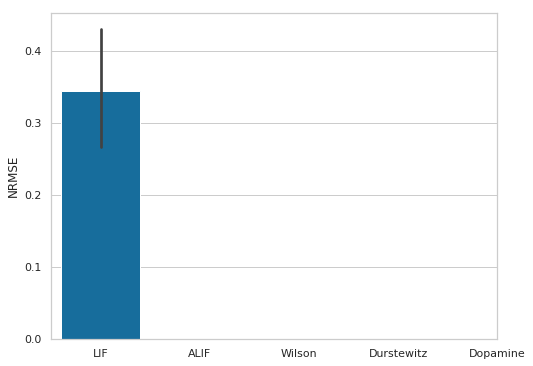

In [26]:
kwargs = dict(
    t=10,
    dt=0.001,
    dt_sample=0.001,
    n_neurons=100,
    freq=10,
    max_rates=Uniform(20, 20),
    intercepts=Uniform(-1, 1),
    neuron_type=nengo.LIF(),
    taus={'network': 0.1, 'readout': 0.1},
    seeds={'ns': 1, 'ss':2, 'es': 3, 'cs': 4, 'ls': 5},
    lambda_d=1e-1,
    lambda_c=1e-1,
    order=1,
    n_samples=10000,
    mean_taus=[0.1],
    std_taus=[0.01],
    signal='white_noise')

nrmses = run_trials(n_trials=10, optimize_h=False, **kwargs)

supervised simulation


/home/pduggins/.virtualenvs/nbn/lib/python3.6/site-packages/nengolib/signal/system.py:197: UserWarning: y0 (None!=0) does not properly initialize the system; see Nengo issue #1124.
  "Nengo issue #1124." % y0, UserWarning)
/home/pduggins/nengo/nengo/utils/numpy.py:79: FutureWarning: Using a non-tuple sequence for multidimensional indexing is deprecated; use `arr[tuple(seq)]` instead of `arr[seq]`. In the future this will be interpreted as an array index, `arr[np.array(seq)]`, which will result either in an error or a different result.
  v = a[inds]


HtmlProgressBar cannot be displayed. Please use the TerminalProgressBar. It can be enabled with `nengo.rc.set('progress', 'progress_bar', 'nengo.utils.progress.TerminalProgressBar')`.

HtmlProgressBar cannot be displayed. Please use the TerminalProgressBar. It can be enabled with `nengo.rc.set('progress', 'progress_bar', 'nengo.utils.progress.TerminalProgressBar')`.

least-squares optimization of recurrent filter and/or decoders


/home/pduggins/.virtualenvs/nbn/lib/python3.6/site-packages/nengolib/signal/system.py:213: UserWarning: Synapse ((num=[ 1000. -1000.], den=[1. 0.], analog=False)) has extra delay due to passthrough (https://github.com/nengo/nengo/issues/938).
  "(https://github.com/nengo/nengo/issues/938)." % sys)
/home/pduggins/.virtualenvs/nbn/lib/python3.6/site-packages/nengolib/signal/system.py:213: UserWarning: Synapse ((A=[[-0.]], B=[[1.]], C=[[-1000.]], D=[[1000.]], analog=False)) has extra delay due to passthrough (https://github.com/nengo/nengo/issues/938).
  "(https://github.com/nengo/nengo/issues/938)." % sys)


taus attempt 0, nonzero d 100:  [1.31301620e-01 1.30216718e-04]
testing
trial 0


HtmlProgressBar cannot be displayed. Please use the TerminalProgressBar. It can be enabled with `nengo.rc.set('progress', 'progress_bar', 'nengo.utils.progress.TerminalProgressBar')`.

HtmlProgressBar cannot be displayed. Please use the TerminalProgressBar. It can be enabled with `nengo.rc.set('progress', 'progress_bar', 'nengo.utils.progress.TerminalProgressBar')`.

trial 1


HtmlProgressBar cannot be displayed. Please use the TerminalProgressBar. It can be enabled with `nengo.rc.set('progress', 'progress_bar', 'nengo.utils.progress.TerminalProgressBar')`.

HtmlProgressBar cannot be displayed. Please use the TerminalProgressBar. It can be enabled with `nengo.rc.set('progress', 'progress_bar', 'nengo.utils.progress.TerminalProgressBar')`.

trial 2


HtmlProgressBar cannot be displayed. Please use the TerminalProgressBar. It can be enabled with `nengo.rc.set('progress', 'progress_bar', 'nengo.utils.progress.TerminalProgressBar')`.

HtmlProgressBar cannot be displayed. Please use the TerminalProgressBar. It can be enabled with `nengo.rc.set('progress', 'progress_bar', 'nengo.utils.progress.TerminalProgressBar')`.

trial 3


HtmlProgressBar cannot be displayed. Please use the TerminalProgressBar. It can be enabled with `nengo.rc.set('progress', 'progress_bar', 'nengo.utils.progress.TerminalProgressBar')`.

HtmlProgressBar cannot be displayed. Please use the TerminalProgressBar. It can be enabled with `nengo.rc.set('progress', 'progress_bar', 'nengo.utils.progress.TerminalProgressBar')`.

trial 4


HtmlProgressBar cannot be displayed. Please use the TerminalProgressBar. It can be enabled with `nengo.rc.set('progress', 'progress_bar', 'nengo.utils.progress.TerminalProgressBar')`.

HtmlProgressBar cannot be displayed. Please use the TerminalProgressBar. It can be enabled with `nengo.rc.set('progress', 'progress_bar', 'nengo.utils.progress.TerminalProgressBar')`.

trial 5


HtmlProgressBar cannot be displayed. Please use the TerminalProgressBar. It can be enabled with `nengo.rc.set('progress', 'progress_bar', 'nengo.utils.progress.TerminalProgressBar')`.

HtmlProgressBar cannot be displayed. Please use the TerminalProgressBar. It can be enabled with `nengo.rc.set('progress', 'progress_bar', 'nengo.utils.progress.TerminalProgressBar')`.

trial 6


HtmlProgressBar cannot be displayed. Please use the TerminalProgressBar. It can be enabled with `nengo.rc.set('progress', 'progress_bar', 'nengo.utils.progress.TerminalProgressBar')`.

HtmlProgressBar cannot be displayed. Please use the TerminalProgressBar. It can be enabled with `nengo.rc.set('progress', 'progress_bar', 'nengo.utils.progress.TerminalProgressBar')`.

trial 7


HtmlProgressBar cannot be displayed. Please use the TerminalProgressBar. It can be enabled with `nengo.rc.set('progress', 'progress_bar', 'nengo.utils.progress.TerminalProgressBar')`.

HtmlProgressBar cannot be displayed. Please use the TerminalProgressBar. It can be enabled with `nengo.rc.set('progress', 'progress_bar', 'nengo.utils.progress.TerminalProgressBar')`.

trial 8


HtmlProgressBar cannot be displayed. Please use the TerminalProgressBar. It can be enabled with `nengo.rc.set('progress', 'progress_bar', 'nengo.utils.progress.TerminalProgressBar')`.

HtmlProgressBar cannot be displayed. Please use the TerminalProgressBar. It can be enabled with `nengo.rc.set('progress', 'progress_bar', 'nengo.utils.progress.TerminalProgressBar')`.

trial 9


HtmlProgressBar cannot be displayed. Please use the TerminalProgressBar. It can be enabled with `nengo.rc.set('progress', 'progress_bar', 'nengo.utils.progress.TerminalProgressBar')`.

HtmlProgressBar cannot be displayed. Please use the TerminalProgressBar. It can be enabled with `nengo.rc.set('progress', 'progress_bar', 'nengo.utils.progress.TerminalProgressBar')`.

/home/pduggins/.virtualenvs/nbn/lib/python3.6/site-packages/scipy/stats/stats.py:1713: FutureWarning: Using a non-tuple sequence for multidimensional indexing is deprecated; use `arr[tuple(seq)]` instead of `arr[seq]`. In the future this will be interpreted as an array index, `arr[np.array(seq)]`, which will result either in an error or a different result.
  return np.add.reduce(sorted[indexer] * weights, axis=axis) / sumval


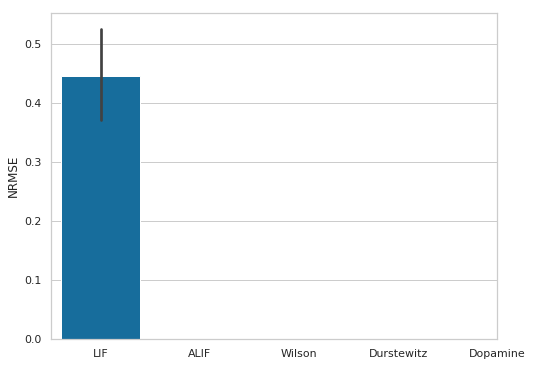

In [27]:
kwargs = dict(
    t=10,
    dt=0.001,
    dt_sample=0.001,
    n_neurons=100,
    freq=10,
    max_rates=Uniform(20, 20),
    intercepts=Uniform(-1, 1),
    neuron_type=nengo.LIF(),
    taus={'network': 0.1, 'readout': 0.1},
    seeds={'ns': 1, 'ss':2, 'es': 3, 'cs': 4, 'ls': 5},
    lambda_d=1e-1,
    lambda_c=1e-1,
    order=2,
    n_samples=10000,
    mean_taus=[0.001, 0.1],
    std_taus=[0.0001, 0.01],
    signal='white_noise')

nrmses = run_trials(n_trials=10, optimize_h=True, **kwargs)

## ALIF

supervised simulation


/home/pduggins/.virtualenvs/nbn/lib/python3.6/site-packages/nengolib/signal/system.py:197: UserWarning: y0 (None!=0) does not properly initialize the system; see Nengo issue #1124.
  "Nengo issue #1124." % y0, UserWarning)


HtmlProgressBar cannot be displayed. Please use the TerminalProgressBar. It can be enabled with `nengo.rc.set('progress', 'progress_bar', 'nengo.utils.progress.TerminalProgressBar')`.

/home/pduggins/nengo/nengo/utils/numpy.py:79: FutureWarning: Using a non-tuple sequence for multidimensional indexing is deprecated; use `arr[tuple(seq)]` instead of `arr[seq]`. In the future this will be interpreted as an array index, `arr[np.array(seq)]`, which will result either in an error or a different result.
  v = a[inds]


HtmlProgressBar cannot be displayed. Please use the TerminalProgressBar. It can be enabled with `nengo.rc.set('progress', 'progress_bar', 'nengo.utils.progress.TerminalProgressBar')`.

least-squares optimization of recurrent filter and/or decoders
testing
trial 0


HtmlProgressBar cannot be displayed. Please use the TerminalProgressBar. It can be enabled with `nengo.rc.set('progress', 'progress_bar', 'nengo.utils.progress.TerminalProgressBar')`.

HtmlProgressBar cannot be displayed. Please use the TerminalProgressBar. It can be enabled with `nengo.rc.set('progress', 'progress_bar', 'nengo.utils.progress.TerminalProgressBar')`.

trial 1


HtmlProgressBar cannot be displayed. Please use the TerminalProgressBar. It can be enabled with `nengo.rc.set('progress', 'progress_bar', 'nengo.utils.progress.TerminalProgressBar')`.

HtmlProgressBar cannot be displayed. Please use the TerminalProgressBar. It can be enabled with `nengo.rc.set('progress', 'progress_bar', 'nengo.utils.progress.TerminalProgressBar')`.

trial 2


HtmlProgressBar cannot be displayed. Please use the TerminalProgressBar. It can be enabled with `nengo.rc.set('progress', 'progress_bar', 'nengo.utils.progress.TerminalProgressBar')`.

HtmlProgressBar cannot be displayed. Please use the TerminalProgressBar. It can be enabled with `nengo.rc.set('progress', 'progress_bar', 'nengo.utils.progress.TerminalProgressBar')`.

trial 3


HtmlProgressBar cannot be displayed. Please use the TerminalProgressBar. It can be enabled with `nengo.rc.set('progress', 'progress_bar', 'nengo.utils.progress.TerminalProgressBar')`.

HtmlProgressBar cannot be displayed. Please use the TerminalProgressBar. It can be enabled with `nengo.rc.set('progress', 'progress_bar', 'nengo.utils.progress.TerminalProgressBar')`.

trial 4


HtmlProgressBar cannot be displayed. Please use the TerminalProgressBar. It can be enabled with `nengo.rc.set('progress', 'progress_bar', 'nengo.utils.progress.TerminalProgressBar')`.

HtmlProgressBar cannot be displayed. Please use the TerminalProgressBar. It can be enabled with `nengo.rc.set('progress', 'progress_bar', 'nengo.utils.progress.TerminalProgressBar')`.

trial 5


HtmlProgressBar cannot be displayed. Please use the TerminalProgressBar. It can be enabled with `nengo.rc.set('progress', 'progress_bar', 'nengo.utils.progress.TerminalProgressBar')`.

HtmlProgressBar cannot be displayed. Please use the TerminalProgressBar. It can be enabled with `nengo.rc.set('progress', 'progress_bar', 'nengo.utils.progress.TerminalProgressBar')`.

trial 6


HtmlProgressBar cannot be displayed. Please use the TerminalProgressBar. It can be enabled with `nengo.rc.set('progress', 'progress_bar', 'nengo.utils.progress.TerminalProgressBar')`.

HtmlProgressBar cannot be displayed. Please use the TerminalProgressBar. It can be enabled with `nengo.rc.set('progress', 'progress_bar', 'nengo.utils.progress.TerminalProgressBar')`.

trial 7


HtmlProgressBar cannot be displayed. Please use the TerminalProgressBar. It can be enabled with `nengo.rc.set('progress', 'progress_bar', 'nengo.utils.progress.TerminalProgressBar')`.

HtmlProgressBar cannot be displayed. Please use the TerminalProgressBar. It can be enabled with `nengo.rc.set('progress', 'progress_bar', 'nengo.utils.progress.TerminalProgressBar')`.

trial 8


HtmlProgressBar cannot be displayed. Please use the TerminalProgressBar. It can be enabled with `nengo.rc.set('progress', 'progress_bar', 'nengo.utils.progress.TerminalProgressBar')`.

HtmlProgressBar cannot be displayed. Please use the TerminalProgressBar. It can be enabled with `nengo.rc.set('progress', 'progress_bar', 'nengo.utils.progress.TerminalProgressBar')`.

trial 9


HtmlProgressBar cannot be displayed. Please use the TerminalProgressBar. It can be enabled with `nengo.rc.set('progress', 'progress_bar', 'nengo.utils.progress.TerminalProgressBar')`.

HtmlProgressBar cannot be displayed. Please use the TerminalProgressBar. It can be enabled with `nengo.rc.set('progress', 'progress_bar', 'nengo.utils.progress.TerminalProgressBar')`.

/home/pduggins/.virtualenvs/nbn/lib/python3.6/site-packages/scipy/stats/stats.py:1713: FutureWarning: Using a non-tuple sequence for multidimensional indexing is deprecated; use `arr[tuple(seq)]` instead of `arr[seq]`. In the future this will be interpreted as an array index, `arr[np.array(seq)]`, which will result either in an error or a different result.
  return np.add.reduce(sorted[indexer] * weights, axis=axis) / sumval


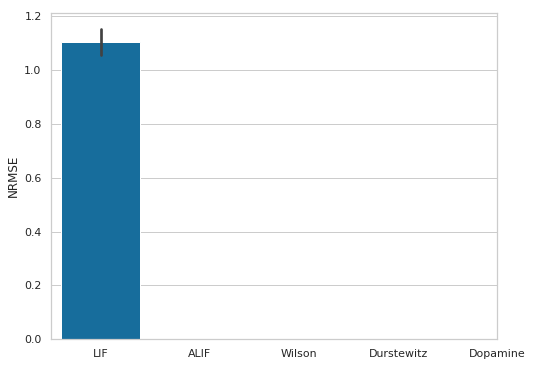

In [28]:
kwargs = dict(
    t=10,
    dt=0.001,
    dt_sample=0.001,
    n_neurons=100,
    freq=10,
    max_rates=Uniform(20, 20),
    intercepts=Uniform(-1, 1),
    neuron_type=AdaptiveLIFT(tau_adapt=0.1, inc_adapt=0.1),
    taus={'network': 0.1, 'readout': 0.1},
    seeds={'ns': 1, 'ss':2, 'es': 4, 'cs': 4, 'ls': 5},
    lambda_d=1e-1,
    lambda_c=1e-1,
    order=1,
    n_samples=10000,
    mean_taus=[0.1],
    std_taus=[0.01],
    signal='white_noise')

nrmses = run_trials(n_trials=10, optimize_h=False, **kwargs)

supervised simulation


/home/pduggins/.virtualenvs/nbn/lib/python3.6/site-packages/nengolib/signal/system.py:197: UserWarning: y0 (None!=0) does not properly initialize the system; see Nengo issue #1124.
  "Nengo issue #1124." % y0, UserWarning)


HtmlProgressBar cannot be displayed. Please use the TerminalProgressBar. It can be enabled with `nengo.rc.set('progress', 'progress_bar', 'nengo.utils.progress.TerminalProgressBar')`.

/home/pduggins/nengo/nengo/utils/numpy.py:79: FutureWarning: Using a non-tuple sequence for multidimensional indexing is deprecated; use `arr[tuple(seq)]` instead of `arr[seq]`. In the future this will be interpreted as an array index, `arr[np.array(seq)]`, which will result either in an error or a different result.
  v = a[inds]


HtmlProgressBar cannot be displayed. Please use the TerminalProgressBar. It can be enabled with `nengo.rc.set('progress', 'progress_bar', 'nengo.utils.progress.TerminalProgressBar')`.

least-squares optimization of recurrent filter and/or decoders


/home/pduggins/.virtualenvs/nbn/lib/python3.6/site-packages/nengolib/signal/system.py:213: UserWarning: Synapse ((num=[ 1000. -1000.], den=[1. 0.], analog=False)) has extra delay due to passthrough (https://github.com/nengo/nengo/issues/938).
  "(https://github.com/nengo/nengo/issues/938)." % sys)


taus attempt 0, nonzero d 100:  [0.18000785]
testing
trial 0


HtmlProgressBar cannot be displayed. Please use the TerminalProgressBar. It can be enabled with `nengo.rc.set('progress', 'progress_bar', 'nengo.utils.progress.TerminalProgressBar')`.

HtmlProgressBar cannot be displayed. Please use the TerminalProgressBar. It can be enabled with `nengo.rc.set('progress', 'progress_bar', 'nengo.utils.progress.TerminalProgressBar')`.

trial 1


HtmlProgressBar cannot be displayed. Please use the TerminalProgressBar. It can be enabled with `nengo.rc.set('progress', 'progress_bar', 'nengo.utils.progress.TerminalProgressBar')`.

HtmlProgressBar cannot be displayed. Please use the TerminalProgressBar. It can be enabled with `nengo.rc.set('progress', 'progress_bar', 'nengo.utils.progress.TerminalProgressBar')`.

trial 2


HtmlProgressBar cannot be displayed. Please use the TerminalProgressBar. It can be enabled with `nengo.rc.set('progress', 'progress_bar', 'nengo.utils.progress.TerminalProgressBar')`.

HtmlProgressBar cannot be displayed. Please use the TerminalProgressBar. It can be enabled with `nengo.rc.set('progress', 'progress_bar', 'nengo.utils.progress.TerminalProgressBar')`.

trial 3


HtmlProgressBar cannot be displayed. Please use the TerminalProgressBar. It can be enabled with `nengo.rc.set('progress', 'progress_bar', 'nengo.utils.progress.TerminalProgressBar')`.

HtmlProgressBar cannot be displayed. Please use the TerminalProgressBar. It can be enabled with `nengo.rc.set('progress', 'progress_bar', 'nengo.utils.progress.TerminalProgressBar')`.

trial 4


HtmlProgressBar cannot be displayed. Please use the TerminalProgressBar. It can be enabled with `nengo.rc.set('progress', 'progress_bar', 'nengo.utils.progress.TerminalProgressBar')`.

HtmlProgressBar cannot be displayed. Please use the TerminalProgressBar. It can be enabled with `nengo.rc.set('progress', 'progress_bar', 'nengo.utils.progress.TerminalProgressBar')`.

trial 5


HtmlProgressBar cannot be displayed. Please use the TerminalProgressBar. It can be enabled with `nengo.rc.set('progress', 'progress_bar', 'nengo.utils.progress.TerminalProgressBar')`.

HtmlProgressBar cannot be displayed. Please use the TerminalProgressBar. It can be enabled with `nengo.rc.set('progress', 'progress_bar', 'nengo.utils.progress.TerminalProgressBar')`.

trial 6


HtmlProgressBar cannot be displayed. Please use the TerminalProgressBar. It can be enabled with `nengo.rc.set('progress', 'progress_bar', 'nengo.utils.progress.TerminalProgressBar')`.

HtmlProgressBar cannot be displayed. Please use the TerminalProgressBar. It can be enabled with `nengo.rc.set('progress', 'progress_bar', 'nengo.utils.progress.TerminalProgressBar')`.

trial 7


HtmlProgressBar cannot be displayed. Please use the TerminalProgressBar. It can be enabled with `nengo.rc.set('progress', 'progress_bar', 'nengo.utils.progress.TerminalProgressBar')`.

HtmlProgressBar cannot be displayed. Please use the TerminalProgressBar. It can be enabled with `nengo.rc.set('progress', 'progress_bar', 'nengo.utils.progress.TerminalProgressBar')`.

trial 8


HtmlProgressBar cannot be displayed. Please use the TerminalProgressBar. It can be enabled with `nengo.rc.set('progress', 'progress_bar', 'nengo.utils.progress.TerminalProgressBar')`.

HtmlProgressBar cannot be displayed. Please use the TerminalProgressBar. It can be enabled with `nengo.rc.set('progress', 'progress_bar', 'nengo.utils.progress.TerminalProgressBar')`.

trial 9


HtmlProgressBar cannot be displayed. Please use the TerminalProgressBar. It can be enabled with `nengo.rc.set('progress', 'progress_bar', 'nengo.utils.progress.TerminalProgressBar')`.

HtmlProgressBar cannot be displayed. Please use the TerminalProgressBar. It can be enabled with `nengo.rc.set('progress', 'progress_bar', 'nengo.utils.progress.TerminalProgressBar')`.

/home/pduggins/.virtualenvs/nbn/lib/python3.6/site-packages/scipy/stats/stats.py:1713: FutureWarning: Using a non-tuple sequence for multidimensional indexing is deprecated; use `arr[tuple(seq)]` instead of `arr[seq]`. In the future this will be interpreted as an array index, `arr[np.array(seq)]`, which will result either in an error or a different result.
  return np.add.reduce(sorted[indexer] * weights, axis=axis) / sumval


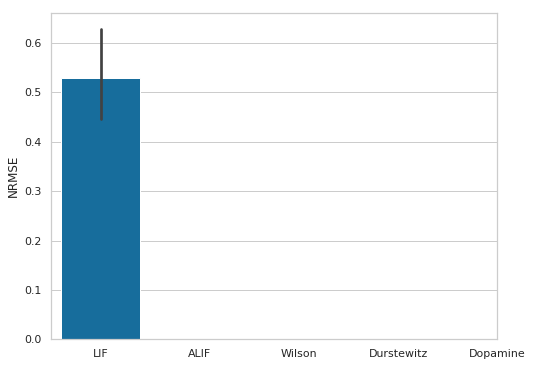

In [30]:
kwargs = dict(
    t=10,
    dt=0.001,
    dt_sample=0.001,
    n_neurons=100,
    freq=10,
    max_rates=Uniform(20, 20),
    intercepts=Uniform(-1, 1),
    neuron_type=AdaptiveLIFT(tau_adapt=0.1, inc_adapt=0.1),
    taus={'network': 0.1, 'readout': 0.1},
    seeds={'ns': 1, 'ss':2, 'es': 4, 'cs': 4, 'ls': 5},
    lambda_d=1e-1,
    lambda_c=1e-1,
    order=1,
    n_samples=10000,
    mean_taus=[0.1],
    std_taus=[0.01],
    signal='white_noise')

nrmses = run_trials(n_trials=10, optimize_h=True, **kwargs)

## Wilson

supervised simulation


/home/pduggins/.virtualenvs/nbn/lib/python3.6/site-packages/nengolib/signal/system.py:197: UserWarning: y0 (None!=0) does not properly initialize the system; see Nengo issue #1124.
  "Nengo issue #1124." % y0, UserWarning)


HtmlProgressBar cannot be displayed. Please use the TerminalProgressBar. It can be enabled with `nengo.rc.set('progress', 'progress_bar', 'nengo.utils.progress.TerminalProgressBar')`.

/home/pduggins/nengo/nengo/utils/numpy.py:79: FutureWarning: Using a non-tuple sequence for multidimensional indexing is deprecated; use `arr[tuple(seq)]` instead of `arr[seq]`. In the future this will be interpreted as an array index, `arr[np.array(seq)]`, which will result either in an error or a different result.
  v = a[inds]


HtmlProgressBar cannot be displayed. Please use the TerminalProgressBar. It can be enabled with `nengo.rc.set('progress', 'progress_bar', 'nengo.utils.progress.TerminalProgressBar')`.

least-squares optimization of recurrent filter and/or decoders
testing
trial 0


HtmlProgressBar cannot be displayed. Please use the TerminalProgressBar. It can be enabled with `nengo.rc.set('progress', 'progress_bar', 'nengo.utils.progress.TerminalProgressBar')`.

HtmlProgressBar cannot be displayed. Please use the TerminalProgressBar. It can be enabled with `nengo.rc.set('progress', 'progress_bar', 'nengo.utils.progress.TerminalProgressBar')`.

trial 1


HtmlProgressBar cannot be displayed. Please use the TerminalProgressBar. It can be enabled with `nengo.rc.set('progress', 'progress_bar', 'nengo.utils.progress.TerminalProgressBar')`.

HtmlProgressBar cannot be displayed. Please use the TerminalProgressBar. It can be enabled with `nengo.rc.set('progress', 'progress_bar', 'nengo.utils.progress.TerminalProgressBar')`.

trial 2


HtmlProgressBar cannot be displayed. Please use the TerminalProgressBar. It can be enabled with `nengo.rc.set('progress', 'progress_bar', 'nengo.utils.progress.TerminalProgressBar')`.

HtmlProgressBar cannot be displayed. Please use the TerminalProgressBar. It can be enabled with `nengo.rc.set('progress', 'progress_bar', 'nengo.utils.progress.TerminalProgressBar')`.

trial 3


HtmlProgressBar cannot be displayed. Please use the TerminalProgressBar. It can be enabled with `nengo.rc.set('progress', 'progress_bar', 'nengo.utils.progress.TerminalProgressBar')`.

HtmlProgressBar cannot be displayed. Please use the TerminalProgressBar. It can be enabled with `nengo.rc.set('progress', 'progress_bar', 'nengo.utils.progress.TerminalProgressBar')`.

trial 4


HtmlProgressBar cannot be displayed. Please use the TerminalProgressBar. It can be enabled with `nengo.rc.set('progress', 'progress_bar', 'nengo.utils.progress.TerminalProgressBar')`.

HtmlProgressBar cannot be displayed. Please use the TerminalProgressBar. It can be enabled with `nengo.rc.set('progress', 'progress_bar', 'nengo.utils.progress.TerminalProgressBar')`.

trial 5


HtmlProgressBar cannot be displayed. Please use the TerminalProgressBar. It can be enabled with `nengo.rc.set('progress', 'progress_bar', 'nengo.utils.progress.TerminalProgressBar')`.

HtmlProgressBar cannot be displayed. Please use the TerminalProgressBar. It can be enabled with `nengo.rc.set('progress', 'progress_bar', 'nengo.utils.progress.TerminalProgressBar')`.

trial 6


HtmlProgressBar cannot be displayed. Please use the TerminalProgressBar. It can be enabled with `nengo.rc.set('progress', 'progress_bar', 'nengo.utils.progress.TerminalProgressBar')`.

HtmlProgressBar cannot be displayed. Please use the TerminalProgressBar. It can be enabled with `nengo.rc.set('progress', 'progress_bar', 'nengo.utils.progress.TerminalProgressBar')`.

trial 7


HtmlProgressBar cannot be displayed. Please use the TerminalProgressBar. It can be enabled with `nengo.rc.set('progress', 'progress_bar', 'nengo.utils.progress.TerminalProgressBar')`.

HtmlProgressBar cannot be displayed. Please use the TerminalProgressBar. It can be enabled with `nengo.rc.set('progress', 'progress_bar', 'nengo.utils.progress.TerminalProgressBar')`.

trial 8


HtmlProgressBar cannot be displayed. Please use the TerminalProgressBar. It can be enabled with `nengo.rc.set('progress', 'progress_bar', 'nengo.utils.progress.TerminalProgressBar')`.

HtmlProgressBar cannot be displayed. Please use the TerminalProgressBar. It can be enabled with `nengo.rc.set('progress', 'progress_bar', 'nengo.utils.progress.TerminalProgressBar')`.

trial 9


HtmlProgressBar cannot be displayed. Please use the TerminalProgressBar. It can be enabled with `nengo.rc.set('progress', 'progress_bar', 'nengo.utils.progress.TerminalProgressBar')`.

HtmlProgressBar cannot be displayed. Please use the TerminalProgressBar. It can be enabled with `nengo.rc.set('progress', 'progress_bar', 'nengo.utils.progress.TerminalProgressBar')`.

/home/pduggins/.virtualenvs/nbn/lib/python3.6/site-packages/scipy/stats/stats.py:1713: FutureWarning: Using a non-tuple sequence for multidimensional indexing is deprecated; use `arr[tuple(seq)]` instead of `arr[seq]`. In the future this will be interpreted as an array index, `arr[np.array(seq)]`, which will result either in an error or a different result.
  return np.add.reduce(sorted[indexer] * weights, axis=axis) / sumval


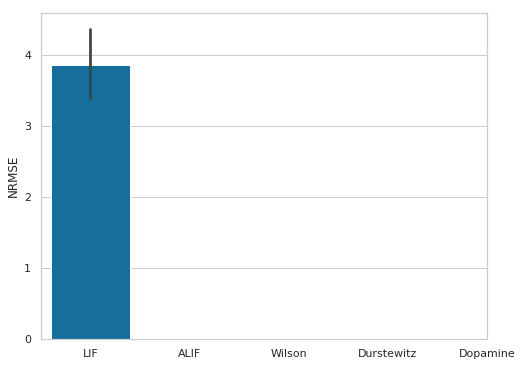

In [31]:
kwargs = dict(
    t=10,
    dt=0.00025,
    dt_sample=0.00025,
    n_neurons=100,
    freq=10,
    max_rates=Uniform(20, 20),
    intercepts=Uniform(-1, 1),
    neuron_type=WilsonRK4(),
    taus={'network': 0.1, 'readout': 0.1},
    seeds={'ns': 1, 'ss':2, 'es': 3, 'cs': 4, 'ls': 5},
    lambda_d=1e-1,
    lambda_c=1e-1,
    order=1,
    n_samples=10000,
    mean_taus=[0.1],
    std_taus=[0.01],
    signal='white_noise')

nrmses = run_trials(n_trials=10, optimize_h=False, **kwargs)

supervised simulation


/home/pduggins/.virtualenvs/nbn/lib/python3.6/site-packages/nengolib/signal/system.py:197: UserWarning: y0 (None!=0) does not properly initialize the system; see Nengo issue #1124.
  "Nengo issue #1124." % y0, UserWarning)


HtmlProgressBar cannot be displayed. Please use the TerminalProgressBar. It can be enabled with `nengo.rc.set('progress', 'progress_bar', 'nengo.utils.progress.TerminalProgressBar')`.

/home/pduggins/nengo/nengo/utils/numpy.py:79: FutureWarning: Using a non-tuple sequence for multidimensional indexing is deprecated; use `arr[tuple(seq)]` instead of `arr[seq]`. In the future this will be interpreted as an array index, `arr[np.array(seq)]`, which will result either in an error or a different result.
  v = a[inds]


HtmlProgressBar cannot be displayed. Please use the TerminalProgressBar. It can be enabled with `nengo.rc.set('progress', 'progress_bar', 'nengo.utils.progress.TerminalProgressBar')`.

least-squares optimization of recurrent filter and/or decoders


/home/pduggins/.virtualenvs/nbn/lib/python3.6/site-packages/nengolib/signal/system.py:213: UserWarning: Synapse ((num=[ 4000. -4000.], den=[1. 0.], analog=False)) has extra delay due to passthrough (https://github.com/nengo/nengo/issues/938).
  "(https://github.com/nengo/nengo/issues/938)." % sys)


taus attempt 0, nonzero d 97:  [0.17718062]
testing
trial 0


HtmlProgressBar cannot be displayed. Please use the TerminalProgressBar. It can be enabled with `nengo.rc.set('progress', 'progress_bar', 'nengo.utils.progress.TerminalProgressBar')`.

HtmlProgressBar cannot be displayed. Please use the TerminalProgressBar. It can be enabled with `nengo.rc.set('progress', 'progress_bar', 'nengo.utils.progress.TerminalProgressBar')`.

trial 1


HtmlProgressBar cannot be displayed. Please use the TerminalProgressBar. It can be enabled with `nengo.rc.set('progress', 'progress_bar', 'nengo.utils.progress.TerminalProgressBar')`.

HtmlProgressBar cannot be displayed. Please use the TerminalProgressBar. It can be enabled with `nengo.rc.set('progress', 'progress_bar', 'nengo.utils.progress.TerminalProgressBar')`.

trial 2


HtmlProgressBar cannot be displayed. Please use the TerminalProgressBar. It can be enabled with `nengo.rc.set('progress', 'progress_bar', 'nengo.utils.progress.TerminalProgressBar')`.

HtmlProgressBar cannot be displayed. Please use the TerminalProgressBar. It can be enabled with `nengo.rc.set('progress', 'progress_bar', 'nengo.utils.progress.TerminalProgressBar')`.

trial 3


HtmlProgressBar cannot be displayed. Please use the TerminalProgressBar. It can be enabled with `nengo.rc.set('progress', 'progress_bar', 'nengo.utils.progress.TerminalProgressBar')`.

HtmlProgressBar cannot be displayed. Please use the TerminalProgressBar. It can be enabled with `nengo.rc.set('progress', 'progress_bar', 'nengo.utils.progress.TerminalProgressBar')`.

trial 4


HtmlProgressBar cannot be displayed. Please use the TerminalProgressBar. It can be enabled with `nengo.rc.set('progress', 'progress_bar', 'nengo.utils.progress.TerminalProgressBar')`.

HtmlProgressBar cannot be displayed. Please use the TerminalProgressBar. It can be enabled with `nengo.rc.set('progress', 'progress_bar', 'nengo.utils.progress.TerminalProgressBar')`.

trial 5


HtmlProgressBar cannot be displayed. Please use the TerminalProgressBar. It can be enabled with `nengo.rc.set('progress', 'progress_bar', 'nengo.utils.progress.TerminalProgressBar')`.

HtmlProgressBar cannot be displayed. Please use the TerminalProgressBar. It can be enabled with `nengo.rc.set('progress', 'progress_bar', 'nengo.utils.progress.TerminalProgressBar')`.

trial 6


HtmlProgressBar cannot be displayed. Please use the TerminalProgressBar. It can be enabled with `nengo.rc.set('progress', 'progress_bar', 'nengo.utils.progress.TerminalProgressBar')`.

HtmlProgressBar cannot be displayed. Please use the TerminalProgressBar. It can be enabled with `nengo.rc.set('progress', 'progress_bar', 'nengo.utils.progress.TerminalProgressBar')`.

trial 7


HtmlProgressBar cannot be displayed. Please use the TerminalProgressBar. It can be enabled with `nengo.rc.set('progress', 'progress_bar', 'nengo.utils.progress.TerminalProgressBar')`.

HtmlProgressBar cannot be displayed. Please use the TerminalProgressBar. It can be enabled with `nengo.rc.set('progress', 'progress_bar', 'nengo.utils.progress.TerminalProgressBar')`.

trial 8


HtmlProgressBar cannot be displayed. Please use the TerminalProgressBar. It can be enabled with `nengo.rc.set('progress', 'progress_bar', 'nengo.utils.progress.TerminalProgressBar')`.

HtmlProgressBar cannot be displayed. Please use the TerminalProgressBar. It can be enabled with `nengo.rc.set('progress', 'progress_bar', 'nengo.utils.progress.TerminalProgressBar')`.

trial 9


HtmlProgressBar cannot be displayed. Please use the TerminalProgressBar. It can be enabled with `nengo.rc.set('progress', 'progress_bar', 'nengo.utils.progress.TerminalProgressBar')`.

HtmlProgressBar cannot be displayed. Please use the TerminalProgressBar. It can be enabled with `nengo.rc.set('progress', 'progress_bar', 'nengo.utils.progress.TerminalProgressBar')`.

/home/pduggins/.virtualenvs/nbn/lib/python3.6/site-packages/scipy/stats/stats.py:1713: FutureWarning: Using a non-tuple sequence for multidimensional indexing is deprecated; use `arr[tuple(seq)]` instead of `arr[seq]`. In the future this will be interpreted as an array index, `arr[np.array(seq)]`, which will result either in an error or a different result.
  return np.add.reduce(sorted[indexer] * weights, axis=axis) / sumval


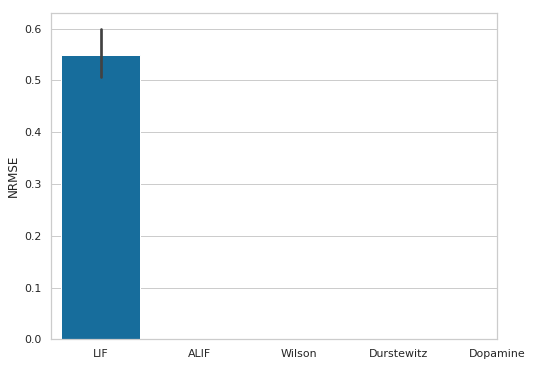

In [32]:
kwargs = dict(
    t=10,
    dt=0.00025,
    dt_sample=0.00025,
    n_neurons=100,
    freq=10,
    max_rates=Uniform(20, 20),
    intercepts=Uniform(-1, 1),
    neuron_type=WilsonRK4(),
    taus={'network': 0.1, 'readout': 0.1},
    seeds={'ns': 1, 'ss':2, 'es': 3, 'cs': 4, 'ls': 5},
    lambda_d=1e-1,
    lambda_c=1e-1,
    order=1,
    n_samples=10000,
    mean_taus=[0.1],
    std_taus=[0.01],
    signal='white_noise')

nrmses = run_trials(n_trials=10, optimize_h=True, **kwargs)

## Durstewitz NEURON

supervised simulation


/home/pduggins/.virtualenvs/nbn/lib/python3.6/site-packages/nengolib/signal/system.py:197: UserWarning: y0 (None!=0) does not properly initialize the system; see Nengo issue #1124.
  "Nengo issue #1124." % y0, UserWarning)


finding gain and bias assuming on/off spiking inputs...


HtmlProgressBar cannot be displayed. Please use the TerminalProgressBar. It can be enabled with `nengo.rc.set('progress', 'progress_bar', 'nengo.utils.progress.TerminalProgressBar')`.

optimized neuron 0
optimized neuron 1


optimized neuron 2
optimized neuron 3
optimized neuron 4
optimized neuron 5
did not find good gain/bias for neuron 6
did not find good gain/bias for neuron 7
optimized neuron 8
did not find good gain/bias for neuron 9
optimized neuron 10
did not find good gain/bias for neuron 11
optimized neuron 12
optimized neuron 13
optimized neuron 14
optimized neuron 15
did not find good gain/bias for neuron 16
did not find good gain/bias for neuron 17
optimized neuron 18
optimized neuron 19
optimized neuron 20
optimized neuron 21
optimized neuron 22
optimized neuron 23
optimized neuron 24
optimized neuron 25
optimized neuron 26
optimized neuron 27
optimized neuron 28
optimized neuron 29
optimized neuron 30
did not find good gain/bias for neuron 31
optimized neuron 32
optimized neuron 33
optimized neuron 34
did not find good gain/bias for neuron 35
did not find good gain/bias for neuron 36
optimized neuron 37
optimized neuron 38
did not find good gain/bias for neuron 39
did not find good gain/bias 

/home/pduggins/nengo/nengo/base.py:107: SyntaxWarning: Creating new attribute 'biasspike' on '<Ensemble "fb">'. Did you mean to change an existing attribute?
  SyntaxWarning)


building  <Connection from <Ensemble "pre_x"> to <Ensemble "fb">>
building  <Connection from <Ensemble "fb"> to <Ensemble "fb">>


/home/pduggins/nengo/nengo/utils/numpy.py:79: FutureWarning: Using a non-tuple sequence for multidimensional indexing is deprecated; use `arr[tuple(seq)]` instead of `arr[seq]`. In the future this will be interpreted as an array index, `arr[np.array(seq)]`, which will result either in an error or a different result.
  v = a[inds]


HtmlProgressBar cannot be displayed. Please use the TerminalProgressBar. It can be enabled with `nengo.rc.set('progress', 'progress_bar', 'nengo.utils.progress.TerminalProgressBar')`.

least-squares optimization of recurrent filter and/or decoders


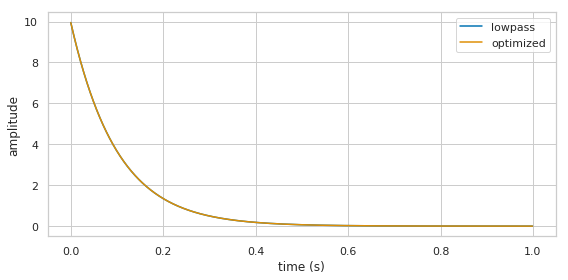

nonzero fb 100


/home/pduggins/.virtualenvs/nbn/lib/python3.6/site-packages/numpy/lib/function_base.py:356: RuntimeWarning: Mean of empty slice.
  avg = a.mean(axis)
/home/pduggins/.virtualenvs/nbn/lib/python3.6/site-packages/numpy/core/_methods.py:85: RuntimeWarning: invalid value encountered in double_scalars
  ret = ret.dtype.type(ret / rcount)
/home/pduggins/.virtualenvs/nbn/lib/python3.6/site-packages/numpy/core/_methods.py:140: RuntimeWarning: Degrees of freedom <= 0 for slice
  keepdims=keepdims)
/home/pduggins/.virtualenvs/nbn/lib/python3.6/site-packages/numpy/core/_methods.py:110: RuntimeWarning: invalid value encountered in true_divide
  arrmean, rcount, out=arrmean, casting='unsafe', subok=False)
/home/pduggins/.virtualenvs/nbn/lib/python3.6/site-packages/numpy/core/_methods.py:132: RuntimeWarning: invalid value encountered in double_scalars
  ret = ret.dtype.type(ret / rcount)


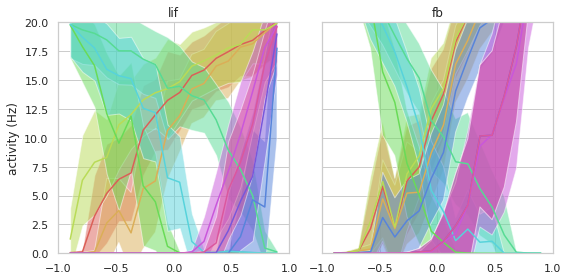

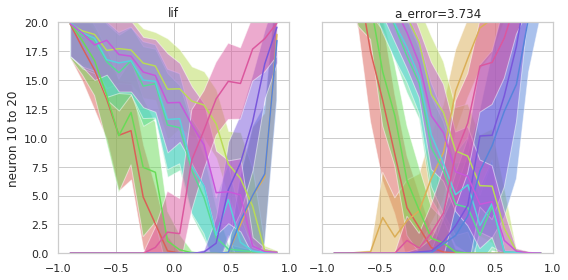

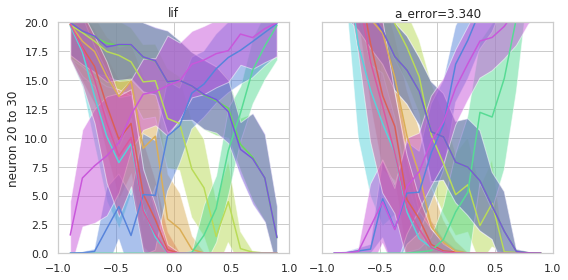

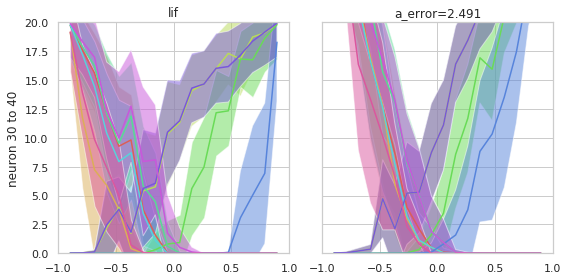

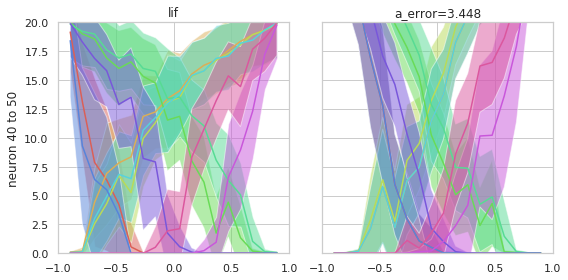

...

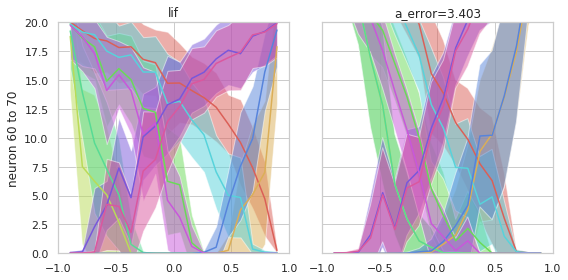

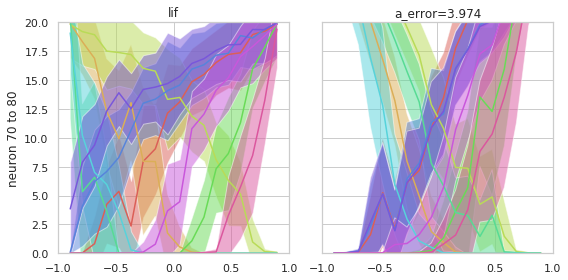

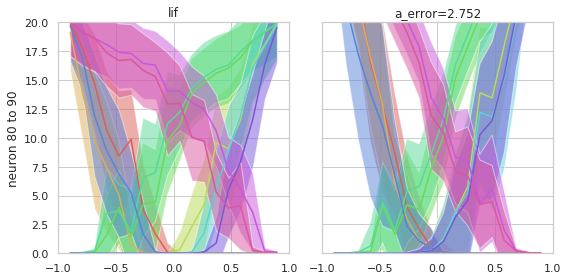

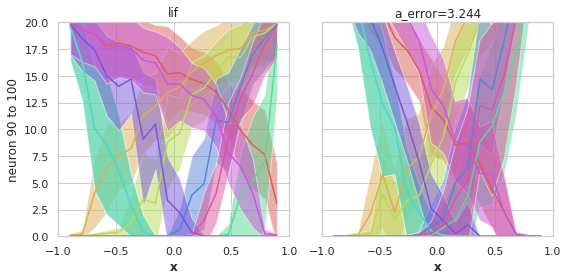

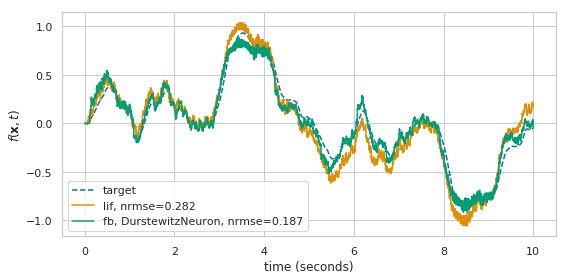

/home/pduggins/.virtualenvs/nbn/lib/python3.6/site-packages/scipy/stats/stats.py:1713: FutureWarning: Using a non-tuple sequence for multidimensional indexing is deprecated; use `arr[tuple(seq)]` instead of `arr[seq]`. In the future this will be interpreted as an array index, `arr[np.array(seq)]`, which will result either in an error or a different result.
  return np.add.reduce(sorted[indexer] * weights, axis=axis) / sumval


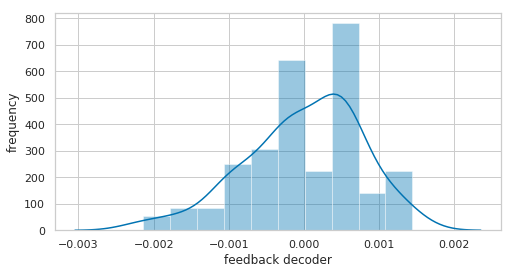

unsupervised simulation
estimating max_rates and intercepts from provided gain/bias...


/home/pduggins/.virtualenvs/nbn/lib/python3.6/site-packages/ipykernel_launcher.py:48: RuntimeWarning: divide by zero encountered in double_scalars


HtmlProgressBar cannot be displayed. Please use the TerminalProgressBar. It can be enabled with `nengo.rc.set('progress', 'progress_bar', 'nengo.utils.progress.TerminalProgressBar')`.

/home/pduggins/nengo/nengo/builder/ensemble.py:97: NengoWarning: Specifying the gains and biases for <Ensemble "fb"> imposes a set of maximum firing rates and intercepts. Further specifying either max_rates or intercepts has no effect.
  "either max_rates or intercepts has no effect." % ens))


max rates [22. 20. 22. 19. 20. 19. 21. 14. 18. 14. 18. 21. 22. 18. 20. 20. 10. 14.
 21. 17. 18. 19. 20. 19. 18. 17. 20. 19. 19. 18. 18. 14. 20. 18. 19. 16.
 13. 20. 17. 13. 14. 22. 23. 20. 22. 22. 14. 18. 14. 17. 19. 21. 22. 22.
 14. 21. 18. 22. 20. 22. 24. 13. 14. 19. 14. 22. 14. 22. 17. 21. 22. 17.
 22. 18. 21. 14. 20. 20. 18. 13. 18. 14. 17. 20. 20. 18. 15. 14. 22. 21.
 20. 22. 20. 14. 13. 14. 18. 17. 22. 18.]
intercepts [-0.6 -0.3 -0.9  0.2 -0.7 -0.1 -0.2  0.3  0.2  0.3  0.2 -0.2 -0.7  0.2
 -0.2 -0.3  0.4  0.3 -0.4  0.1  0.2  0.1 -0.3 -0.9  0.2  0.2 -0.3 -0.9
 -0.9  0.2  0.2  0.3 -0.3  0.1  0.2  0.2  0.3 -0.3  0.2  0.3  0.3 -0.6
 -0.9 -0.3 -0.5 -0.6  0.3  0.1  0.3  0.1 -0.9 -0.1 -0.6 -0.5  0.3 -0.2
  0.1 -0.5 -0.9 -0.6 -0.8  0.3  0.3  0.   0.3 -0.5  0.3 -0.5  0.1 -0.4
 -0.5  0.2 -0.5  0.2 -0.2  0.3 -0.7 -0.9  0.   0.3  0.2  0.3  0.2 -0.2
 -0.3  0.2  0.3  0.3 -0.6 -0.4 -0.9 -0.6 -0.2  0.3  0.3  0.3  0.2  0.1
 -0.7  0.2]
building  <Connection from <Ensemble "pre_u"> to <Ensemble "fb"

HtmlProgressBar cannot be displayed. Please use the TerminalProgressBar. It can be enabled with `nengo.rc.set('progress', 'progress_bar', 'nengo.utils.progress.TerminalProgressBar')`.

nonzero fb 100


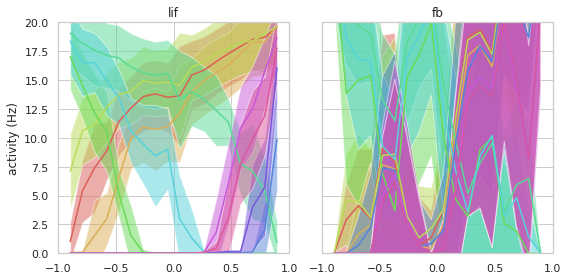

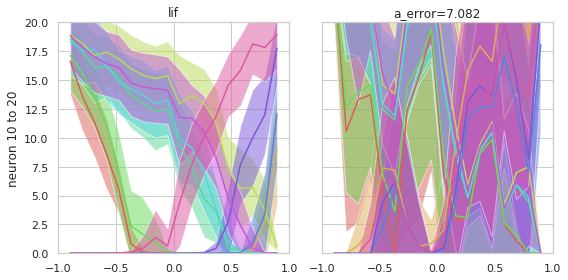

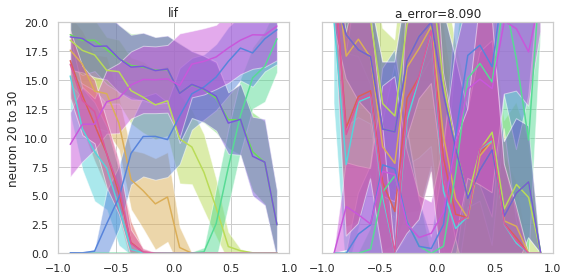

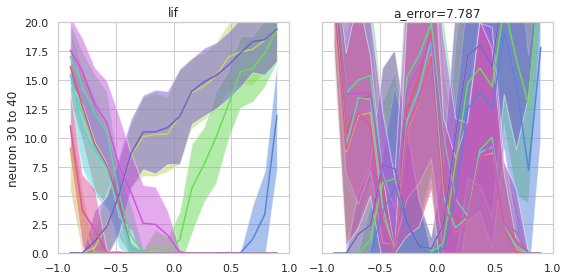

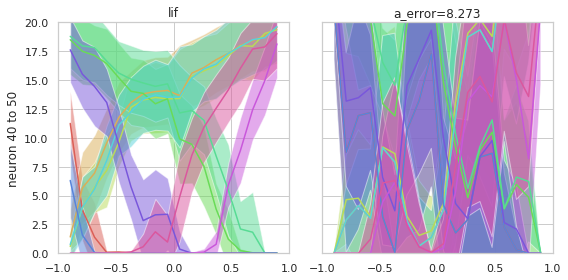

...

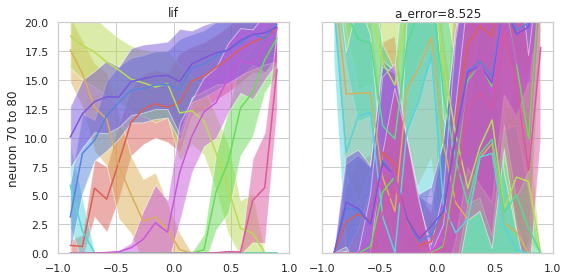

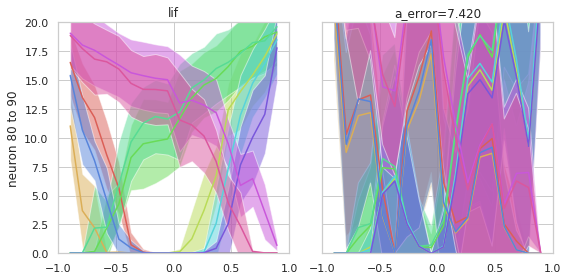

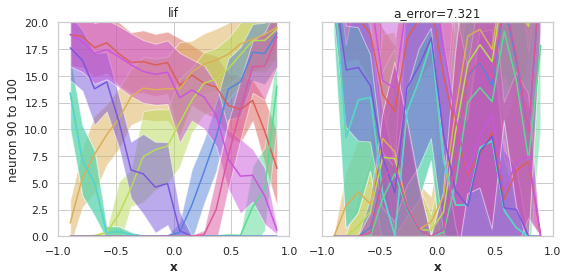

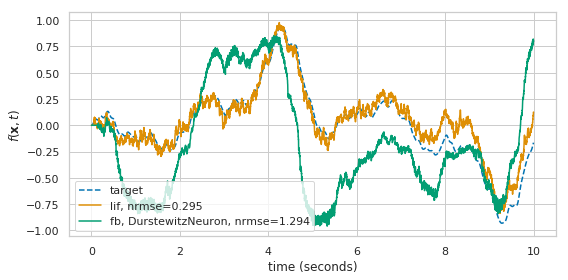

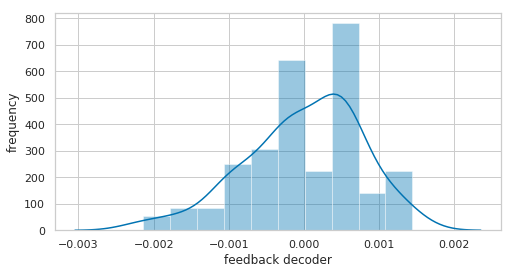

In [23]:
kwargs = dict(
    t=10,
    dt=0.001,
    dt_sample=0.001,
    n_neurons=100,
    freq=10,
    max_rates=Uniform(20, 20),
    intercepts=Uniform(-1, 1),
    neuron_type=DurstewitzNeuron(DA=False, k_weight=4e2),
    taus={'network': 0.1, 'readout': 0.1},
    seeds={'ns': 1, 'ss':2, 'es': 3, 'cs': 4, 'ls': 5},
    lambda_d=1e-1,
    lambda_c=1e-1,
    order=1,
    n_samples=10000,
    mean_taus=[0.1],
    std_taus=[0.01],
    signal='white_noise')

d_fb, h, datadict_train, datadict_test = run_once(optimize_h=False, **kwargs)

supervised simulation


/home/pduggins/.virtualenvs/nbn/lib/python3.6/site-packages/nengolib/signal/system.py:197: UserWarning: y0 (None!=0) does not properly initialize the system; see Nengo issue #1124.
  "Nengo issue #1124." % y0, UserWarning)


finding gain and bias assuming on/off spiking inputs...


HtmlProgressBar cannot be displayed. Please use the TerminalProgressBar. It can be enabled with `nengo.rc.set('progress', 'progress_bar', 'nengo.utils.progress.TerminalProgressBar')`.

optimized neuron 0
optimized neuron 1


optimized neuron 2
optimized neuron 3
optimized neuron 4
optimized neuron 5
did not find good gain/bias for neuron 6
did not find good gain/bias for neuron 7
optimized neuron 8
did not find good gain/bias for neuron 9
optimized neuron 10
did not find good gain/bias for neuron 11
optimized neuron 12
optimized neuron 13
optimized neuron 14
optimized neuron 15
did not find good gain/bias for neuron 16
did not find good gain/bias for neuron 17
optimized neuron 18
optimized neuron 19
optimized neuron 20
optimized neuron 21
optimized neuron 22
optimized neuron 23
optimized neuron 24
optimized neuron 25
optimized neuron 26
optimized neuron 27
optimized neuron 28
optimized neuron 29
optimized neuron 30
did not find good gain/bias for neuron 31
optimized neuron 32
optimized neuron 33
optimized neuron 34
did not find good gain/bias for neuron 35
did not find good gain/bias for neuron 36
optimized neuron 37
optimized neuron 38
did not find good gain/bias for neuron 39
did not find good gain/bias 

/home/pduggins/nengo/nengo/base.py:107: SyntaxWarning: Creating new attribute 'biasspike' on '<Ensemble "fb">'. Did you mean to change an existing attribute?
  SyntaxWarning)


building  <Connection from <Ensemble "pre_x"> to <Ensemble "fb">>
building 

/home/pduggins/nengo/nengo/utils/numpy.py:79: FutureWarning: Using a non-tuple sequence for multidimensional indexing is deprecated; use `arr[tuple(seq)]` instead of `arr[seq]`. In the future this will be interpreted as an array index, `arr[np.array(seq)]`, which will result either in an error or a different result.
  v = a[inds]


 <Connection from <Ensemble "fb"> to <Ensemble "fb">>


HtmlProgressBar cannot be displayed. Please use the TerminalProgressBar. It can be enabled with `nengo.rc.set('progress', 'progress_bar', 'nengo.utils.progress.TerminalProgressBar')`.

least-squares optimization of recurrent filter and/or decoders


/home/pduggins/.virtualenvs/nbn/lib/python3.6/site-packages/nengolib/signal/system.py:213: UserWarning: Synapse ((num=[ 1000. -1000.], den=[1. 0.], analog=False)) has extra delay due to passthrough (https://github.com/nengo/nengo/issues/938).
  "(https://github.com/nengo/nengo/issues/938)." % sys)


taus attempt 0, nonzero d 100:  [0.15321709]


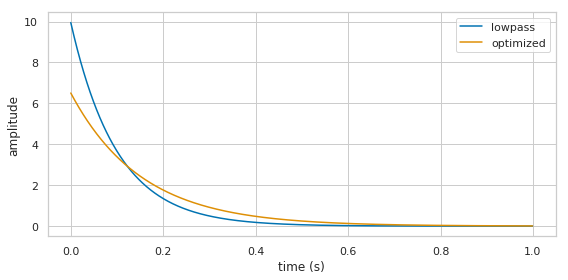

nonzero fb 100


/home/pduggins/.virtualenvs/nbn/lib/python3.6/site-packages/numpy/lib/function_base.py:356: RuntimeWarning: Mean of empty slice.
  avg = a.mean(axis)
/home/pduggins/.virtualenvs/nbn/lib/python3.6/site-packages/numpy/core/_methods.py:85: RuntimeWarning: invalid value encountered in double_scalars
  ret = ret.dtype.type(ret / rcount)
/home/pduggins/.virtualenvs/nbn/lib/python3.6/site-packages/numpy/core/_methods.py:140: RuntimeWarning: Degrees of freedom <= 0 for slice
  keepdims=keepdims)
/home/pduggins/.virtualenvs/nbn/lib/python3.6/site-packages/numpy/core/_methods.py:110: RuntimeWarning: invalid value encountered in true_divide
  arrmean, rcount, out=arrmean, casting='unsafe', subok=False)
/home/pduggins/.virtualenvs/nbn/lib/python3.6/site-packages/numpy/core/_methods.py:132: RuntimeWarning: invalid value encountered in double_scalars
  ret = ret.dtype.type(ret / rcount)


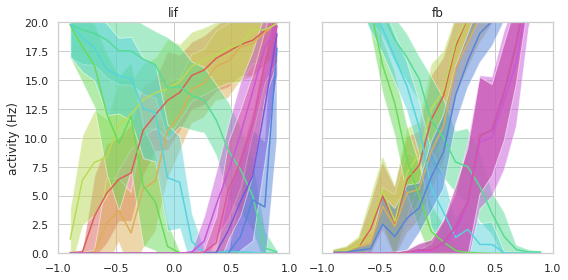

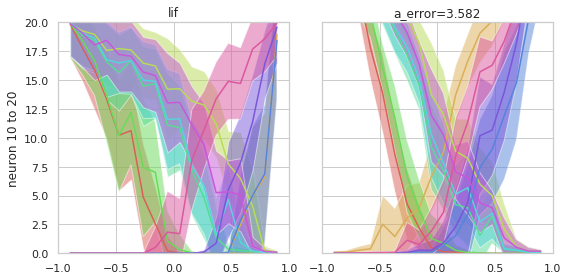

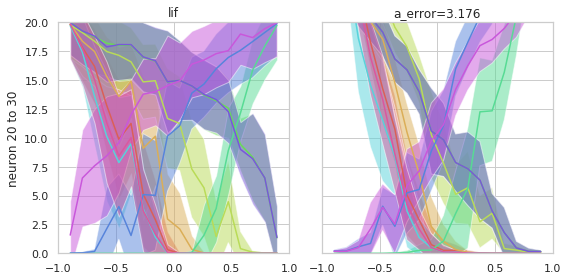

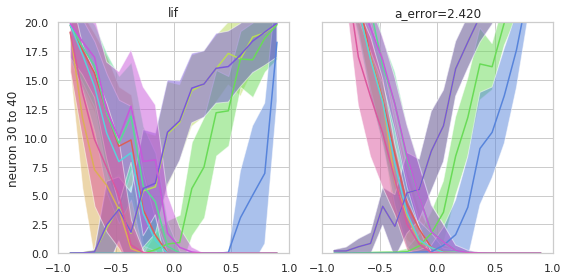

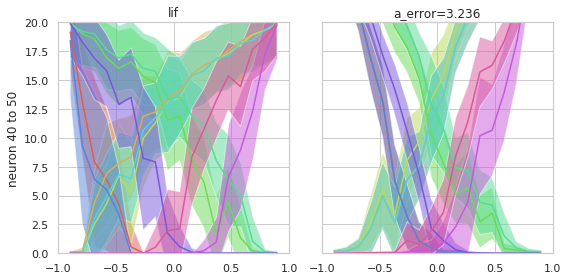

...

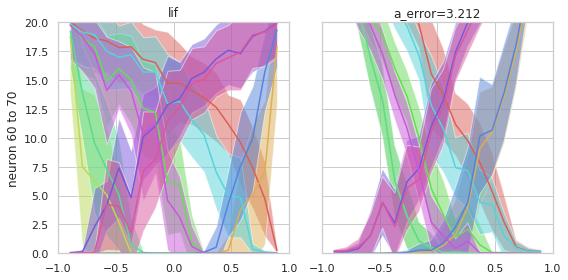

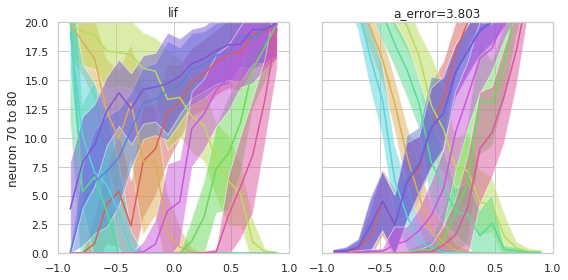

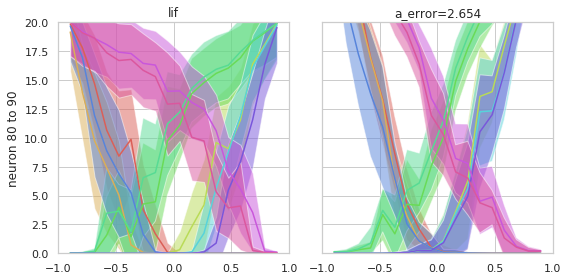

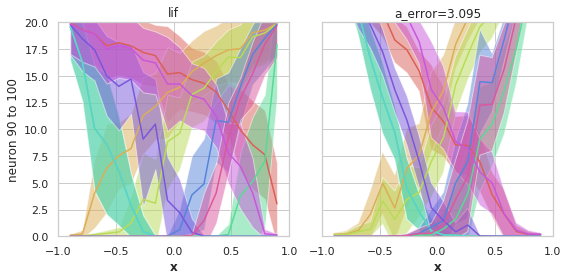

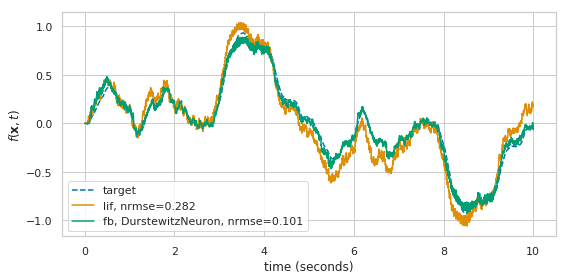

/home/pduggins/.virtualenvs/nbn/lib/python3.6/site-packages/scipy/stats/stats.py:1713: FutureWarning: Using a non-tuple sequence for multidimensional indexing is deprecated; use `arr[tuple(seq)]` instead of `arr[seq]`. In the future this will be interpreted as an array index, `arr[np.array(seq)]`, which will result either in an error or a different result.
  return np.add.reduce(sorted[indexer] * weights, axis=axis) / sumval


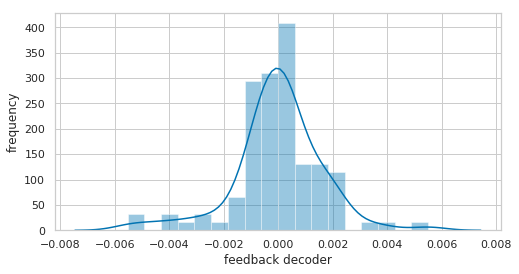

unsupervised simulation
estimating max_rates and intercepts from provided gain/bias...


/home/pduggins/.virtualenvs/nbn/lib/python3.6/site-packages/ipykernel_launcher.py:48: RuntimeWarning: divide by zero encountered in double_scalars


HtmlProgressBar cannot be displayed. Please use the TerminalProgressBar. It can be enabled with `nengo.rc.set('progress', 'progress_bar', 'nengo.utils.progress.TerminalProgressBar')`.

max rates [22. 20. 22. 19. 20. 19. 21. 14. 18. 14. 18. 21. 22. 18. 20. 20. 10. 14.
 21. 17. 18. 19. 20. 19. 18. 17. 20. 19. 19. 18. 18. 14. 20. 18. 19. 16.
 13. 20. 17. 13. 14. 22. 23. 20. 22. 22. 14. 18. 14. 17. 19. 21. 22. 22.
 14. 21. 18. 22. 20. 22. 24. 13. 14. 19. 14. 22. 14. 22. 17. 21. 22. 17.
 22. 18. 21. 14. 20. 20. 18. 13. 18. 14. 17. 20. 20. 18. 15. 14. 22. 21.
 20. 22. 20. 14. 13. 14. 18. 17. 22. 18.]
intercepts [-0.6 -0.3 -0.9  0.2 -0.7 -0.1 -0.2  0.3  0.2  0.3  0.2 -0.2 -0.7  0.2
 -0.2 -0.3  0.4  0.3 -0.4  0.1  0.2  0.1 -0.3 -0.9  0.2  0.2 -0.3 -0.9
 -0.9  0.2  0.2  0.3 -0.3  0.1  0.2  0.2  0.3 -0.3  0.2  0.3  0.3 -0.6
 -0.9 -0.3 -0.5 -0.6  0.3  0.1  0.3  0.1 -0.9 -0.1 -0.6 -0.5  0.3 -0.2
  0.1 -0.5 -0.9 -0.6 -0.8  0.3  0.3  0.   0.3 -0.5  0.3 -0.5  0.1 -0.4
 -0.5  0.2 -0.5  0.2 -0.2  0.3 -0.7 -0.9  0.   0.3  0.2  0.3  0.2 -0.2
 -0.3  0.2  0.3  0.3 -0.6 -0.4 -0.9 -0.6 -0.2  0.3  0.3  0.3  0.2  0.1
 -0.7  0.2]
building  <Connection from <Ensemble "pre_u"> to <Ensemble "fb"

/home/pduggins/nengo/nengo/builder/ensemble.py:97: NengoWarning: Specifying the gains and biases for <Ensemble "fb"> imposes a set of maximum firing rates and intercepts. Further specifying either max_rates or intercepts has no effect.
  "either max_rates or intercepts has no effect." % ens))


building  <Connection from <Ensemble "pre_x"> to <Ensemble "fb">>
building  <Connection from <Ensemble "fb"> to <Ensemble "fb">>


HtmlProgressBar cannot be displayed. Please use the TerminalProgressBar. It can be enabled with `nengo.rc.set('progress', 'progress_bar', 'nengo.utils.progress.TerminalProgressBar')`.

nonzero fb 99


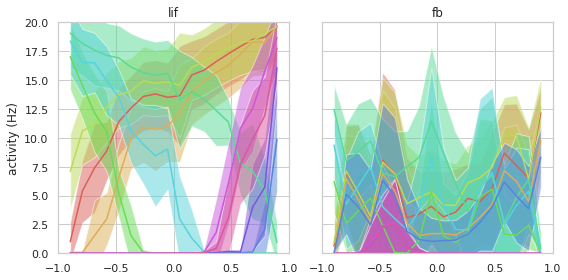

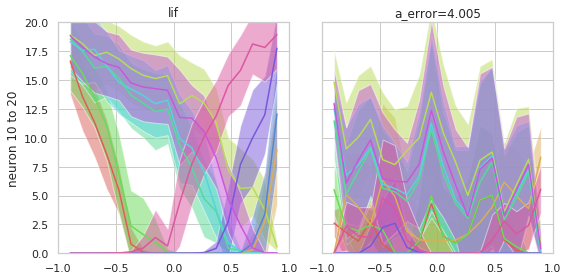

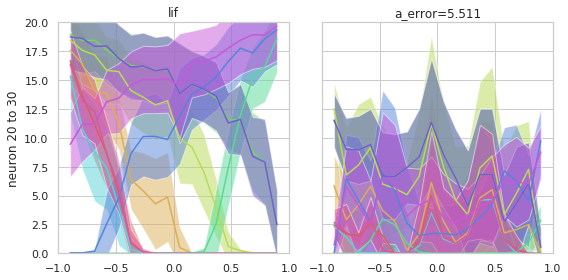

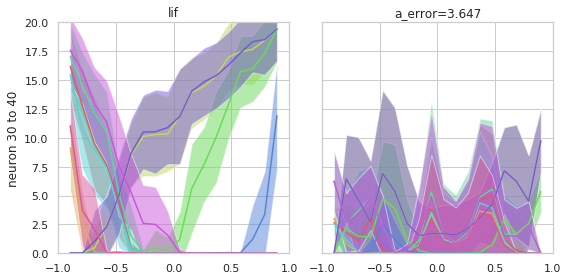

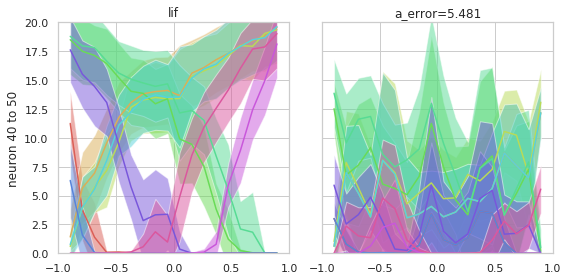

...

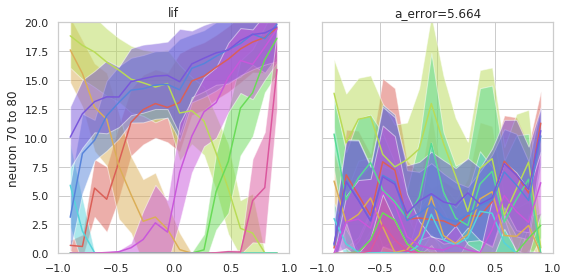

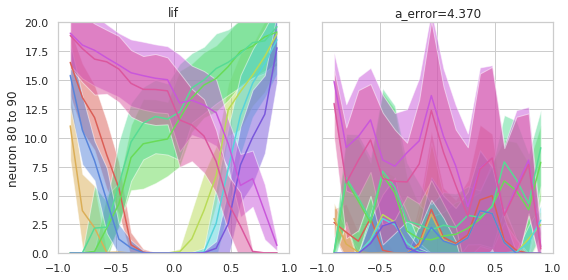

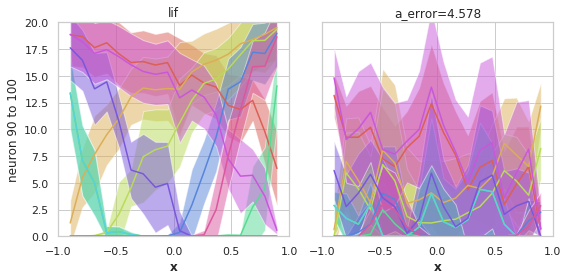

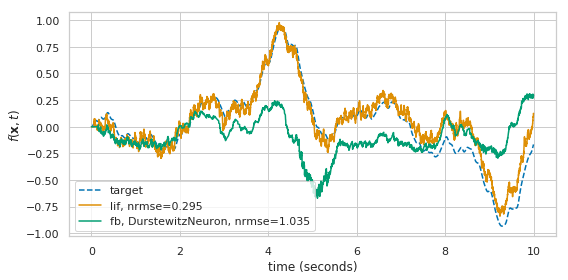

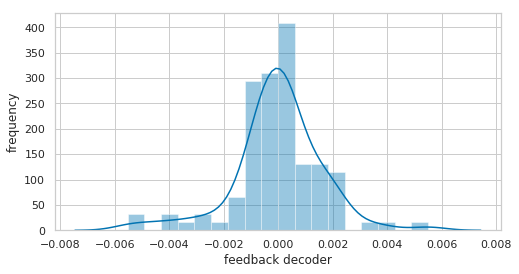

In [19]:
kwargs = dict(
    t=10,
    dt=0.001,
    dt_sample=0.001,
    n_neurons=100,
    freq=10,
    max_rates=Uniform(20, 20),
    intercepts=Uniform(-1, 1),
    neuron_type=DurstewitzNeuron(DA=False, k_weight=4e2),
    taus={'network': 0.1, 'readout': 0.1},
    seeds={'ns': 1, 'ss':2, 'es': 3, 'cs': 4, 'ls': 5},
    lambda_d=1e-1,
    lambda_c=1e-1,
    order=1,
    n_samples=10000,
    mean_taus=[0.1],
    std_taus=[0.01],
    signal='white_noise')

d_fb, h, datadict_train, datadict_test = run_once(optimize_h=True, **kwargs)

supervised simulation


/home/pduggins/.virtualenvs/nbn/lib/python3.6/site-packages/nengolib/signal/system.py:197: UserWarning: y0 (None!=0) does not properly initialize the system; see Nengo issue #1124.
  "Nengo issue #1124." % y0, UserWarning)


finding gain and bias assuming on/off spiking inputs...


HtmlProgressBar cannot be displayed. Please use the TerminalProgressBar. It can be enabled with `nengo.rc.set('progress', 'progress_bar', 'nengo.utils.progress.TerminalProgressBar')`.

optimized neuron 0
optimized neuron 1


optimized neuron 2
optimized neuron 3
optimized neuron 4
optimized neuron 5
did not find good gain/bias for neuron 6
did not find good gain/bias for neuron 7
optimized neuron 8
did not find good gain/bias for neuron 9
optimized neuron 10
did not find good gain/bias for neuron 11
optimized neuron 12
optimized neuron 13
optimized neuron 14
optimized neuron 15
did not find good gain/bias for neuron 16
did not find good gain/bias for neuron 17
optimized neuron 18
optimized neuron 19
optimized neuron 20
optimized neuron 21
optimized neuron 22
optimized neuron 23
optimized neuron 24
optimized neuron 25
optimized neuron 26
optimized neuron 27
optimized neuron 28
optimized neuron 29
optimized neuron 30
did not find good gain/bias for neuron 31
optimized neuron 32
optimized neuron 33
optimized neuron 34
did not find good gain/bias for neuron 35
did not find good gain/bias for neuron 36
optimized neuron 37
optimized neuron 38
did not find good gain/bias for neuron 39
did not find good gain/bias 

/home/pduggins/nengo/nengo/base.py:107: SyntaxWarning: Creating new attribute 'biasspike' on '<Ensemble "fb">'. Did you mean to change an existing attribute?
  SyntaxWarning)


building  <Connection from <Ensemble "pre_x"> to <Ensemble "fb">>
building  <Connection from <Ensemble "fb"> to <Ensemble "fb">>


/home/pduggins/nengo/nengo/utils/numpy.py:79: FutureWarning: Using a non-tuple sequence for multidimensional indexing is deprecated; use `arr[tuple(seq)]` instead of `arr[seq]`. In the future this will be interpreted as an array index, `arr[np.array(seq)]`, which will result either in an error or a different result.
  v = a[inds]


HtmlProgressBar cannot be displayed. Please use the TerminalProgressBar. It can be enabled with `nengo.rc.set('progress', 'progress_bar', 'nengo.utils.progress.TerminalProgressBar')`.

least-squares optimization of recurrent filter and/or decoders


/home/pduggins/.virtualenvs/nbn/lib/python3.6/site-packages/nengolib/signal/system.py:213: UserWarning: Synapse ((num=[ 1000. -1000.], den=[1. 0.], analog=False)) has extra delay due to passthrough (https://github.com/nengo/nengo/issues/938).
  "(https://github.com/nengo/nengo/issues/938)." % sys)


taus attempt 0, nonzero d 100:  [0.15568003]


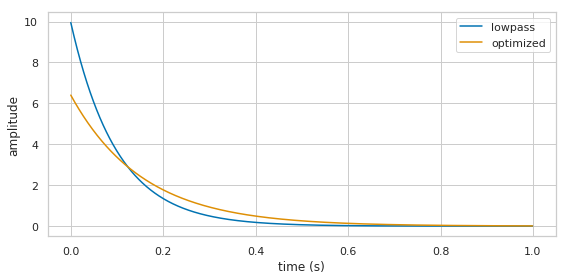

nonzero fb 100


/home/pduggins/.virtualenvs/nbn/lib/python3.6/site-packages/numpy/lib/function_base.py:356: RuntimeWarning: Mean of empty slice.
  avg = a.mean(axis)
/home/pduggins/.virtualenvs/nbn/lib/python3.6/site-packages/numpy/core/_methods.py:85: RuntimeWarning: invalid value encountered in double_scalars
  ret = ret.dtype.type(ret / rcount)
/home/pduggins/.virtualenvs/nbn/lib/python3.6/site-packages/numpy/core/_methods.py:140: RuntimeWarning: Degrees of freedom <= 0 for slice
  keepdims=keepdims)
/home/pduggins/.virtualenvs/nbn/lib/python3.6/site-packages/numpy/core/_methods.py:110: RuntimeWarning: invalid value encountered in true_divide
  arrmean, rcount, out=arrmean, casting='unsafe', subok=False)
/home/pduggins/.virtualenvs/nbn/lib/python3.6/site-packages/numpy/core/_methods.py:132: RuntimeWarning: invalid value encountered in double_scalars
  ret = ret.dtype.type(ret / rcount)


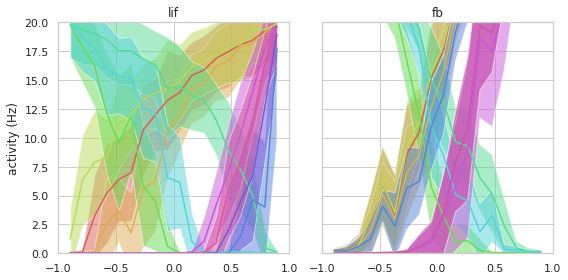

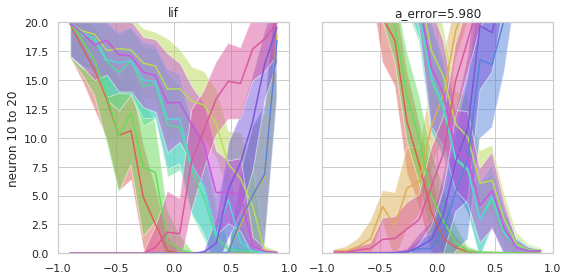

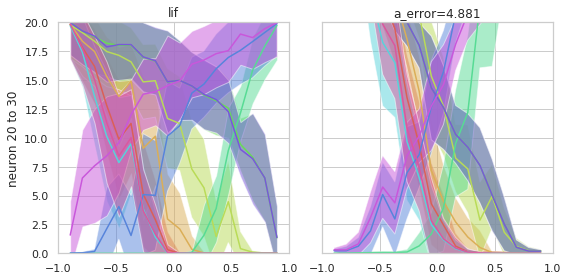

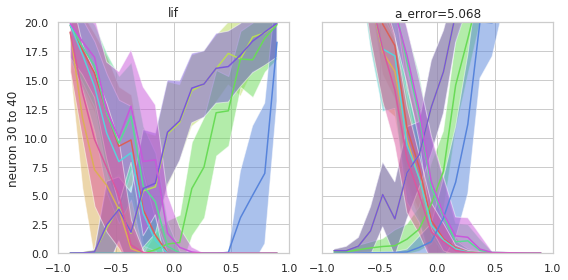

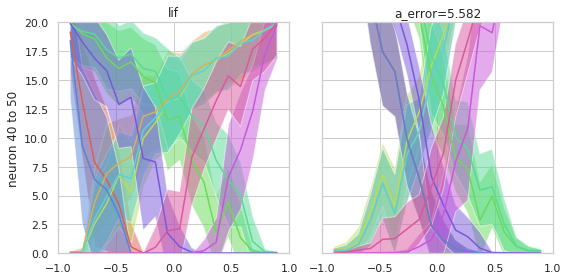

...

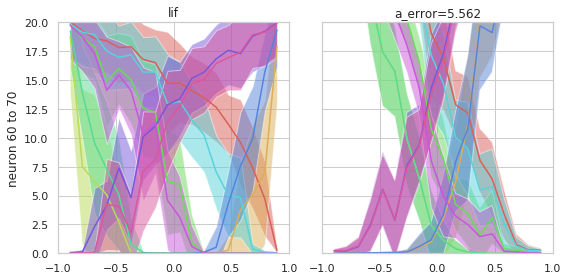

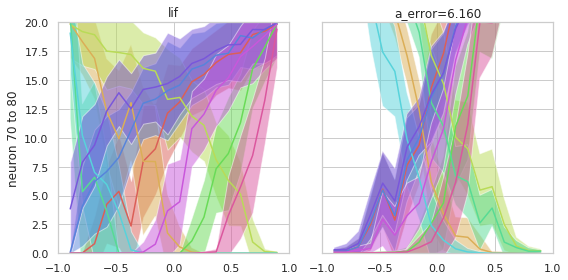

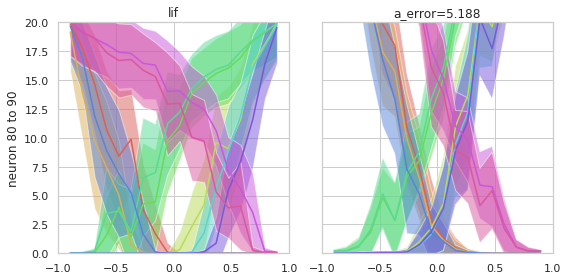

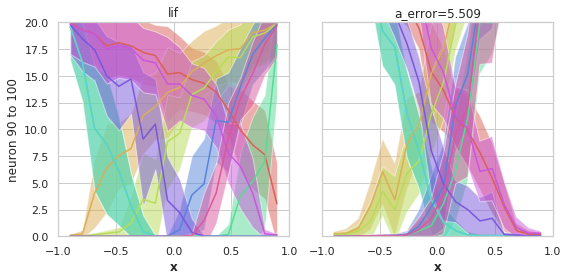

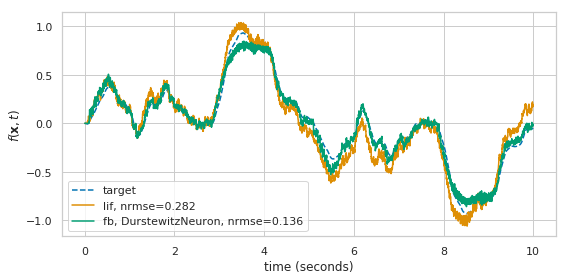

/home/pduggins/.virtualenvs/nbn/lib/python3.6/site-packages/scipy/stats/stats.py:1713: FutureWarning: Using a non-tuple sequence for multidimensional indexing is deprecated; use `arr[tuple(seq)]` instead of `arr[seq]`. In the future this will be interpreted as an array index, `arr[np.array(seq)]`, which will result either in an error or a different result.
  return np.add.reduce(sorted[indexer] * weights, axis=axis) / sumval


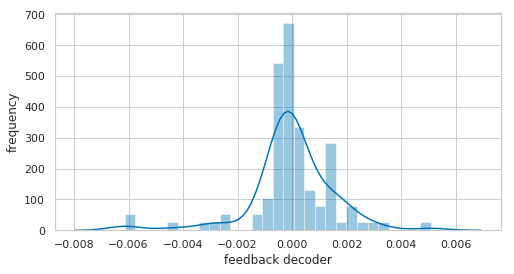

unsupervised simulation
estimating max_rates and intercepts from provided gain/bias...


/home/pduggins/.virtualenvs/nbn/lib/python3.6/site-packages/ipykernel_launcher.py:48: RuntimeWarning: divide by zero encountered in double_scalars


HtmlProgressBar cannot be displayed. Please use the TerminalProgressBar. It can be enabled with `nengo.rc.set('progress', 'progress_bar', 'nengo.utils.progress.TerminalProgressBar')`.

max rates [22. 20. 22. 19. 20. 19. 21. 14. 18. 14. 18. 21. 22. 18. 20. 20. 10. 14.
 21. 17. 18. 19. 20. 19. 18. 17. 20. 19. 19. 18. 18. 14. 20. 18. 19. 16.
 13. 20. 17. 13. 14. 22. 23. 20. 22. 22. 14. 18. 14. 17. 19. 21. 22. 22.
 14. 21. 18. 22. 20. 22. 24. 13. 14. 19. 14. 22. 14. 22. 17. 21. 22. 17.
 22. 18. 21. 14. 20. 20. 18. 13. 18. 14. 17. 20. 20. 18. 15. 14. 22. 21.
 20. 22. 20. 14. 13. 14. 18. 17. 22. 18.]
intercepts [-0.6 -0.3 -0.9  0.2 -0.7 -0.1 -0.2  0.3  0.2  0.3  0.2 -0.2 -0.7  0.2
 -0.2 -0.3  0.4  0.3 -0.4  0.1  0.2  0.1 -0.3 -0.9  0.2  0.2 -0.3 -0.9
 -0.9  0.2  0.2  0.3 -0.3  0.1  0.2  0.2  0.3 -0.3  0.2  0.3  0.3 -0.6
 -0.9 -0.3 -0.5 -0.6  0.3  0.1  0.3  0.1 -0.9 -0.1 -0.6 -0.5  0.3 -0.2
  0.1 -0.5 -0.9 -0.6 -0.8  0.3  0.3  0.   0.3 -0.5  0.3 -0.5  0.1 -0.4
 -0.5  0.2 -0.5  0.2 -0.2  0.3 -0.7 -0.9  0.   0.3  0.2  0.3  0.2 -0.2
 -0.3  0.2  0.3  0.3 -0.6 -0.4 -0.9 -0.6 -0.2  0.3  0.3  0.3  0.2  0.1
 -0.7  0.2]
building  <Connection from <Ensemble "pre_u"> to <Ensemble "fb"

/home/pduggins/nengo/nengo/builder/ensemble.py:97: NengoWarning: Specifying the gains and biases for <Ensemble "fb"> imposes a set of maximum firing rates and intercepts. Further specifying either max_rates or intercepts has no effect.
  "either max_rates or intercepts has no effect." % ens))


building  <Connection from <Ensemble "pre_x"> to <Ensemble "fb">>
building  <Connection from <Ensemble "fb"> to <Ensemble "fb">>


HtmlProgressBar cannot be displayed. Please use the TerminalProgressBar. It can be enabled with `nengo.rc.set('progress', 'progress_bar', 'nengo.utils.progress.TerminalProgressBar')`.

nonzero fb 100


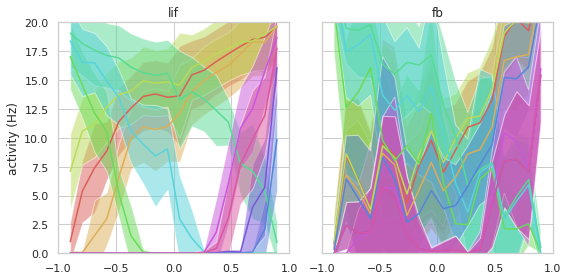

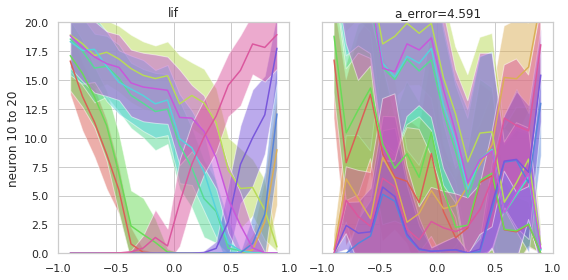

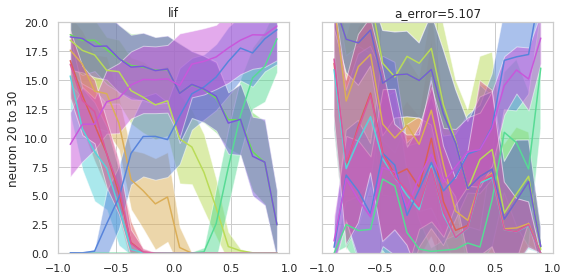

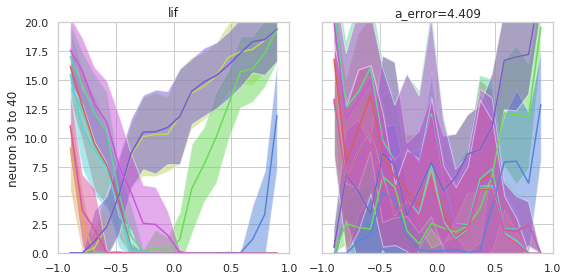

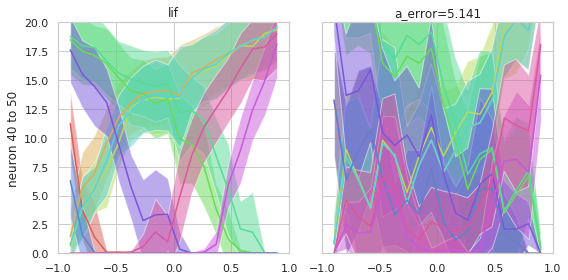

...

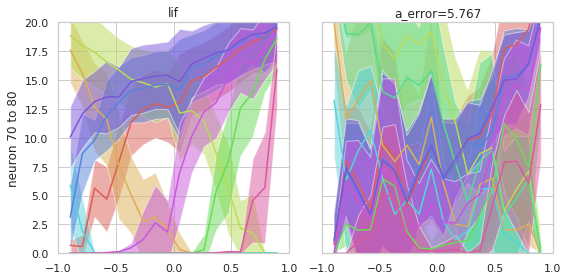

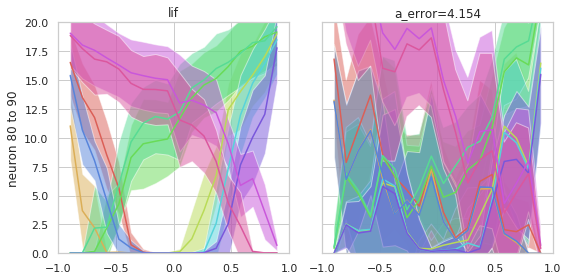

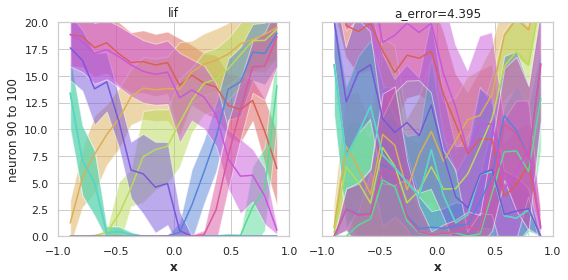

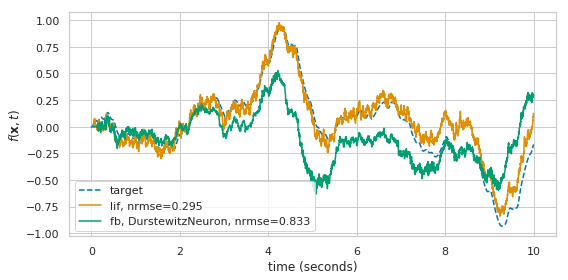

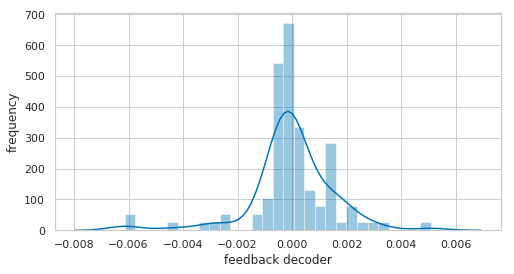

In [20]:
kwargs = dict(
    t=10,
    dt=0.001,
    dt_sample=0.001,
    n_neurons=100,
    freq=10,
    max_rates=Uniform(20, 20),
    intercepts=Uniform(-1, 1),
    neuron_type=DurstewitzNeuron(DA=False, k_weight=6e2),
    taus={'network': 0.1, 'readout': 0.1},
    seeds={'ns': 1, 'ss':2, 'es': 3, 'cs': 4, 'ls': 5},
    lambda_d=1e-1,
    lambda_c=1e-1,
    order=1,
    n_samples=10000,
    mean_taus=[0.1],
    std_taus=[0.01],
    signal='white_noise')

d_fb, h, datadict_train, datadict_test = run_once(optimize_h=True, **kwargs)

supervised simulation


/home/pduggins/.virtualenvs/nbn/lib/python3.6/site-packages/nengolib/signal/system.py:197: UserWarning: y0 (None!=0) does not properly initialize the system; see Nengo issue #1124.
  "Nengo issue #1124." % y0, UserWarning)


finding gain and bias assuming on/off spiking inputs...


HtmlProgressBar cannot be displayed. Please use the TerminalProgressBar. It can be enabled with `nengo.rc.set('progress', 'progress_bar', 'nengo.utils.progress.TerminalProgressBar')`.

optimized neuron 0
optimized neuron 1


optimized neuron 2
optimized neuron 3
optimized neuron 4
optimized neuron 5
did not find good gain/bias for neuron 6
did not find good gain/bias for neuron 7
optimized neuron 8
did not find good gain/bias for neuron 9
optimized neuron 10
did not find good gain/bias for neuron 11
optimized neuron 12
optimized neuron 13
optimized neuron 14
optimized neuron 15
did not find good gain/bias for neuron 16
did not find good gain/bias for neuron 17
optimized neuron 18
optimized neuron 19
optimized neuron 20
optimized neuron 21
optimized neuron 22
optimized neuron 23
optimized neuron 24
optimized neuron 25
optimized neuron 26
optimized neuron 27
optimized neuron 28
optimized neuron 29
optimized neuron 30
did not find good gain/bias for neuron 31
optimized neuron 32
optimized neuron 33
optimized neuron 34
did not find good gain/bias for neuron 35
did not find good gain/bias for neuron 36
optimized neuron 37
optimized neuron 38
did not find good gain/bias for neuron 39
did not find good gain/bias

/home/pduggins/nengo/nengo/base.py:107: SyntaxWarning: Creating new attribute 'biasspike' on '<Ensemble "fb">'. Did you mean to change an existing attribute?
  SyntaxWarning)


building  <Connection from <Ensemble "pre_x"> to <Ensemble "fb">>
building  <Connection from <Ensemble "fb"> to <Ensemble "fb">>


/home/pduggins/nengo/nengo/utils/numpy.py:79: FutureWarning: Using a non-tuple sequence for multidimensional indexing is deprecated; use `arr[tuple(seq)]` instead of `arr[seq]`. In the future this will be interpreted as an array index, `arr[np.array(seq)]`, which will result either in an error or a different result.
  v = a[inds]


HtmlProgressBar cannot be displayed. Please use the TerminalProgressBar. It can be enabled with `nengo.rc.set('progress', 'progress_bar', 'nengo.utils.progress.TerminalProgressBar')`.

least-squares optimization of recurrent filter and/or decoders


/home/pduggins/.virtualenvs/nbn/lib/python3.6/site-packages/nengolib/signal/system.py:213: UserWarning: Synapse ((num=[ 1000. -1000.], den=[1. 0.], analog=False)) has extra delay due to passthrough (https://github.com/nengo/nengo/issues/938).
  "(https://github.com/nengo/nengo/issues/938)." % sys)


taus attempt 0, nonzero d 100:  [0.16284218]


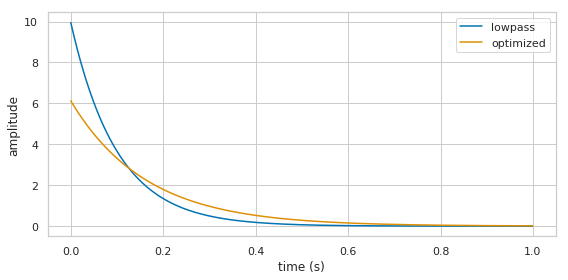

nonzero fb 100


/home/pduggins/.virtualenvs/nbn/lib/python3.6/site-packages/numpy/lib/function_base.py:356: RuntimeWarning: Mean of empty slice.
  avg = a.mean(axis)
/home/pduggins/.virtualenvs/nbn/lib/python3.6/site-packages/numpy/core/_methods.py:85: RuntimeWarning: invalid value encountered in double_scalars
  ret = ret.dtype.type(ret / rcount)
/home/pduggins/.virtualenvs/nbn/lib/python3.6/site-packages/numpy/core/_methods.py:140: RuntimeWarning: Degrees of freedom <= 0 for slice
  keepdims=keepdims)
/home/pduggins/.virtualenvs/nbn/lib/python3.6/site-packages/numpy/core/_methods.py:110: RuntimeWarning: invalid value encountered in true_divide
  arrmean, rcount, out=arrmean, casting='unsafe', subok=False)
/home/pduggins/.virtualenvs/nbn/lib/python3.6/site-packages/numpy/core/_methods.py:132: RuntimeWarning: invalid value encountered in double_scalars
  ret = ret.dtype.type(ret / rcount)


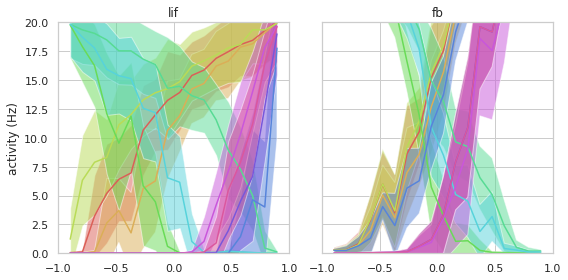

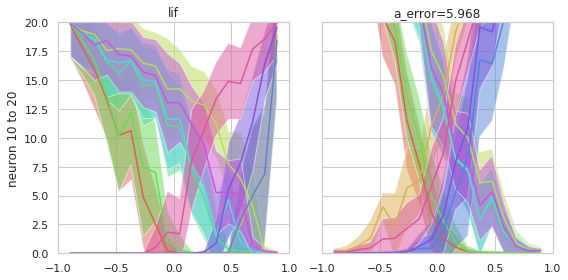

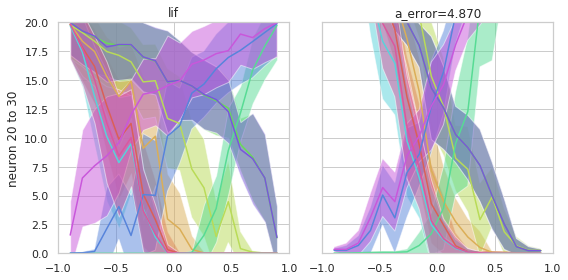

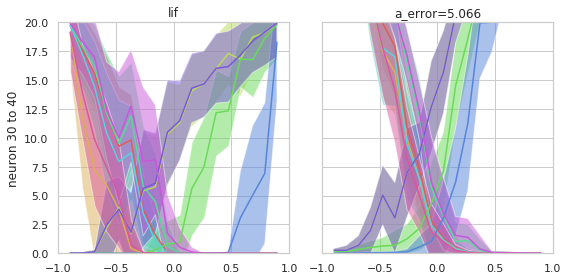

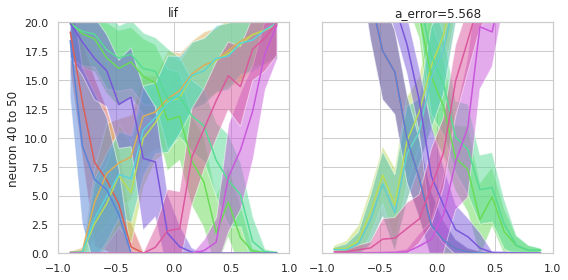

...

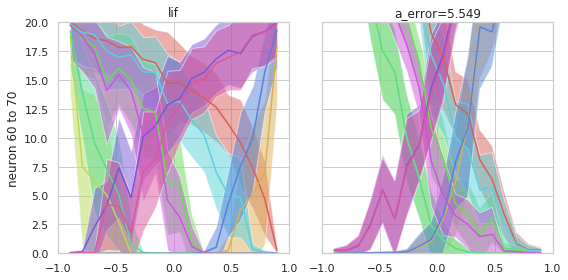

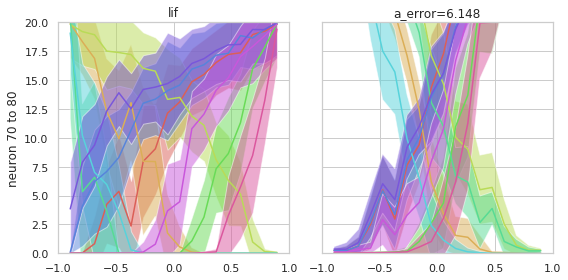

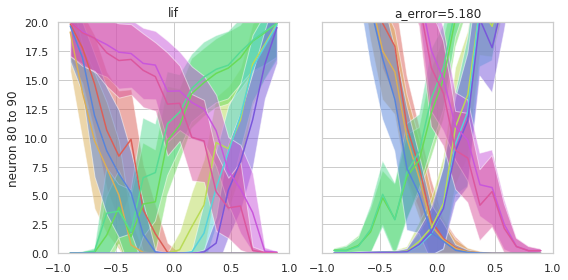

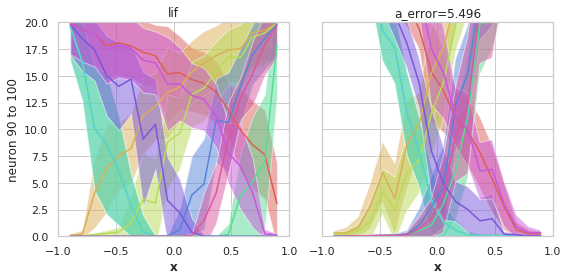

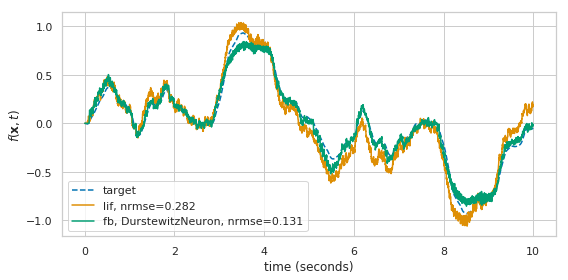

/home/pduggins/.virtualenvs/nbn/lib/python3.6/site-packages/scipy/stats/stats.py:1713: FutureWarning: Using a non-tuple sequence for multidimensional indexing is deprecated; use `arr[tuple(seq)]` instead of `arr[seq]`. In the future this will be interpreted as an array index, `arr[np.array(seq)]`, which will result either in an error or a different result.
  return np.add.reduce(sorted[indexer] * weights, axis=axis) / sumval


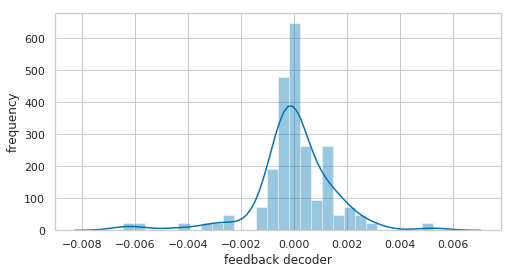

unsupervised simulation
estimating max_rates and intercepts from provided gain/bias...


/home/pduggins/.virtualenvs/nbn/lib/python3.6/site-packages/ipykernel_launcher.py:48: RuntimeWarning: divide by zero encountered in double_scalars


HtmlProgressBar cannot be displayed. Please use the TerminalProgressBar. It can be enabled with `nengo.rc.set('progress', 'progress_bar', 'nengo.utils.progress.TerminalProgressBar')`.

max rates [22. 20. 22. 19. 20. 19. 21. 14. 18. 14. 18. 21. 22. 18. 20. 20. 10. 14.
 21. 17. 18. 19. 20. 19. 18. 17. 20. 19. 19. 18. 18. 14. 20. 18. 19. 16.
 13. 20. 17. 13. 14. 22. 23. 20. 22. 22. 14. 18. 14. 17. 19. 21. 22. 22.
 14. 21. 18. 22. 20. 22. 24. 13. 14. 19. 14. 22. 14. 22. 17. 21. 22. 17.
 22. 18. 21. 14. 20. 20. 18. 13. 18. 14. 17. 20. 20. 18. 15. 14. 22. 21.
 20. 22. 20. 14. 13. 14. 18. 17. 22. 18.]
intercepts [-0.6 -0.3 -0.9  0.2 -0.7 -0.1 -0.2  0.3  0.2  0.3  0.2 -0.2 -0.7  0.2
 -0.2 -0.3  0.4  0.3 -0.4  0.1  0.2  0.1 -0.3 -0.9  0.2  0.2 -0.3 -0.9
 -0.9  0.2  0.2  0.3 -0.3  0.1  0.2  0.2  0.3 -0.3  0.2  0.3  0.3 -0.6
 -0.9 -0.3 -0.5 -0.6  0.3  0.1  0.3  0.1 -0.9 -0.1 -0.6 -0.5  0.3 -0.2
  0.1 -0.5 -0.9 -0.6 -0.8  0.3  0.3  0.   0.3 -0.5  0.3 -0.5  0.1 -0.4
 -0.5  0.2 -0.5  0.2 -0.2  0.3 -0.7 -0.9  0.   0.3  0.2  0.3  0.2 -0.2
 -0.3  0.2  0.3  0.3 -0.6 -0.4 -0.9 -0.6 -0.2  0.3  0.3  0.3  0.2  0.1
 -0.7  0.2]
building  <Connection from <Ensemble "pre_u"> to <Ensemble "fb"

/home/pduggins/nengo/nengo/builder/ensemble.py:97: NengoWarning: Specifying the gains and biases for <Ensemble "fb"> imposes a set of maximum firing rates and intercepts. Further specifying either max_rates or intercepts has no effect.
  "either max_rates or intercepts has no effect." % ens))


building  <Connection from <Ensemble "pre_x"> to <Ensemble "fb">>
building  <Connection from <Ensemble "fb"> to <Ensemble "fb">>


HtmlProgressBar cannot be displayed. Please use the TerminalProgressBar. It can be enabled with `nengo.rc.set('progress', 'progress_bar', 'nengo.utils.progress.TerminalProgressBar')`.

nonzero fb 100


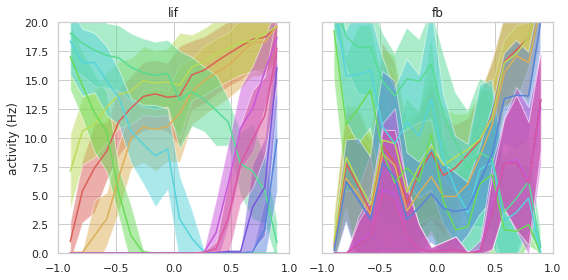

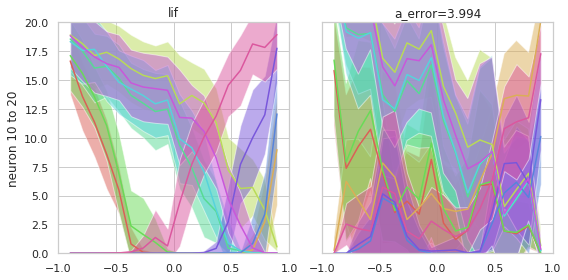

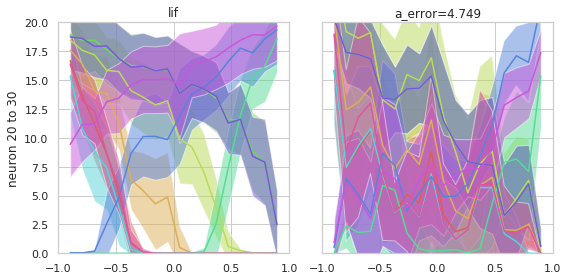

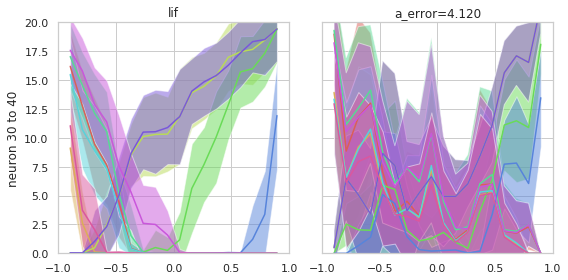

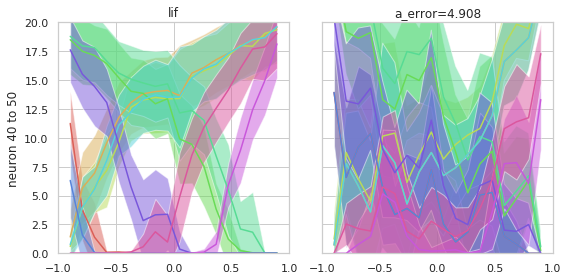

...

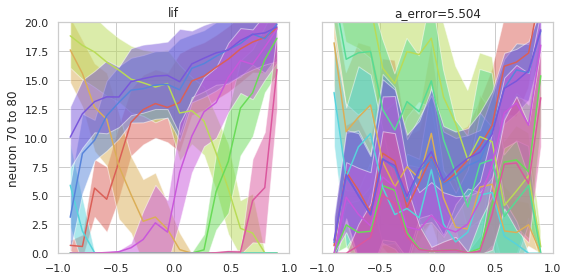

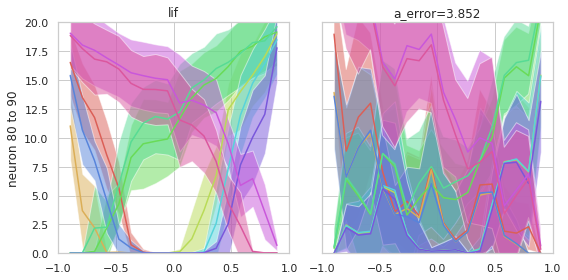

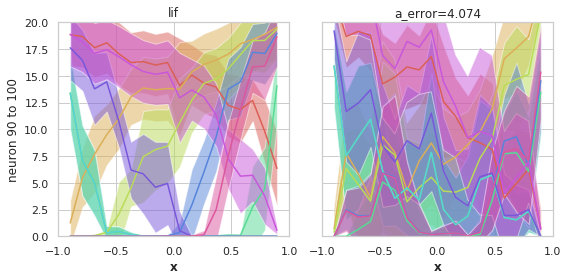

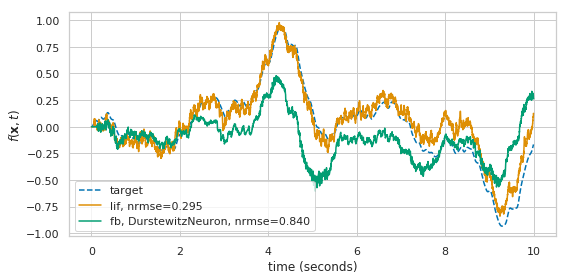

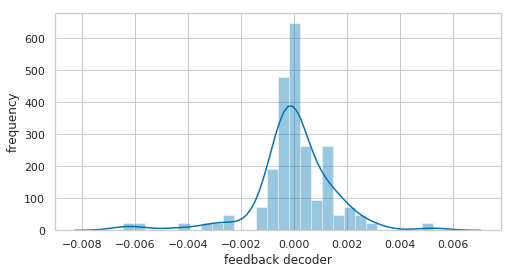

In [21]:
kwargs = dict(
    t=10,
    dt=0.001,
    dt_sample=0.001,
    n_neurons=100,
    freq=10,
    max_rates=Uniform(20, 20),
    intercepts=Uniform(-1, 1),
    neuron_type=DurstewitzNeuron(DA=False, k_weight=6e2),
    taus={'network': 0.1, 'readout': 0.1},
    seeds={'ns': 1, 'ss':2, 'es': 3, 'cs': 4, 'ls': 5},
    lambda_d=1e-2,
    lambda_c=1e-2,
    order=1,
    n_samples=10000,
    mean_taus=[0.1],
    std_taus=[0.01],
    signal='white_noise')

d_fb, h, datadict_train, datadict_test = run_once(optimize_h=True, **kwargs)

supervised simulation


/home/pduggins/.virtualenvs/nbn/lib/python3.6/site-packages/nengolib/signal/system.py:197: UserWarning: y0 (None!=0) does not properly initialize the system; see Nengo issue #1124.
  "Nengo issue #1124." % y0, UserWarning)


finding gain and bias assuming on/off spiking inputs...


HtmlProgressBar cannot be displayed. Please use the TerminalProgressBar. It can be enabled with `nengo.rc.set('progress', 'progress_bar', 'nengo.utils.progress.TerminalProgressBar')`.

optimized neuron 0
optimized neuron 1


optimized neuron 2
optimized neuron 3
optimized neuron 4
optimized neuron 5
did not find good gain/bias for neuron 6
did not find good gain/bias for neuron 7
optimized neuron 8
did not find good gain/bias for neuron 9
optimized neuron 10
did not find good gain/bias for neuron 11
optimized neuron 12
optimized neuron 13
optimized neuron 14
optimized neuron 15
did not find good gain/bias for neuron 16
did not find good gain/bias for neuron 17
optimized neuron 18
optimized neuron 19
optimized neuron 20
optimized neuron 21
optimized neuron 22
optimized neuron 23
optimized neuron 24
optimized neuron 25
optimized neuron 26
optimized neuron 27
optimized neuron 28
optimized neuron 29
optimized neuron 30
did not find good gain/bias for neuron 31
optimized neuron 32
optimized neuron 33
optimized neuron 34
did not find good gain/bias for neuron 35
did not find good gain/bias for neuron 36
optimized neuron 37
optimized neuron 38
did not find good gain/bias for neuron 39
did not find good gain/bias 

/home/pduggins/nengo/nengo/base.py:107: SyntaxWarning: Creating new attribute 'biasspike' on '<Ensemble "fb">'. Did you mean to change an existing attribute?
  SyntaxWarning)


building  <Connection from <Ensemble "pre_x"> to <Ensemble "fb">>
building  <Connection from <Ensemble "fb"> to <Ensemble "fb">>


/home/pduggins/nengo/nengo/utils/numpy.py:79: FutureWarning: Using a non-tuple sequence for multidimensional indexing is deprecated; use `arr[tuple(seq)]` instead of `arr[seq]`. In the future this will be interpreted as an array index, `arr[np.array(seq)]`, which will result either in an error or a different result.
  v = a[inds]


HtmlProgressBar cannot be displayed. Please use the TerminalProgressBar. It can be enabled with `nengo.rc.set('progress', 'progress_bar', 'nengo.utils.progress.TerminalProgressBar')`.

least-squares optimization of recurrent filter and/or decoders


/home/pduggins/.virtualenvs/nbn/lib/python3.6/site-packages/nengolib/signal/system.py:213: UserWarning: Synapse ((num=[ 1000. -1000.], den=[1. 0.], analog=False)) has extra delay due to passthrough (https://github.com/nengo/nengo/issues/938).
  "(https://github.com/nengo/nengo/issues/938)." % sys)
/home/pduggins/.virtualenvs/nbn/lib/python3.6/site-packages/nengolib/signal/system.py:213: UserWarning: Synapse ((A=[[-0.]], B=[[1.]], C=[[-1000.]], D=[[1000.]], analog=False)) has extra delay due to passthrough (https://github.com/nengo/nengo/issues/938).
  "(https://github.com/nengo/nengo/issues/938)." % sys)


taus attempt 0, nonzero d 100:  [1.53135924e-01 1.50057310e-04]


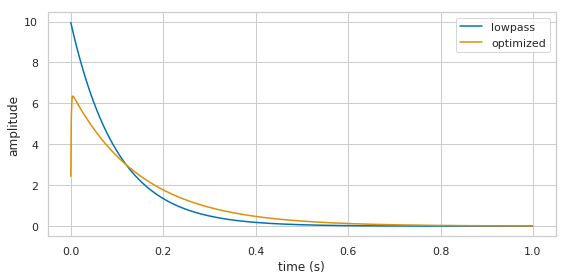

nonzero fb 100


/home/pduggins/.virtualenvs/nbn/lib/python3.6/site-packages/numpy/lib/function_base.py:356: RuntimeWarning: Mean of empty slice.
  avg = a.mean(axis)
/home/pduggins/.virtualenvs/nbn/lib/python3.6/site-packages/numpy/core/_methods.py:85: RuntimeWarning: invalid value encountered in double_scalars
  ret = ret.dtype.type(ret / rcount)
/home/pduggins/.virtualenvs/nbn/lib/python3.6/site-packages/numpy/core/_methods.py:140: RuntimeWarning: Degrees of freedom <= 0 for slice
  keepdims=keepdims)
/home/pduggins/.virtualenvs/nbn/lib/python3.6/site-packages/numpy/core/_methods.py:110: RuntimeWarning: invalid value encountered in true_divide
  arrmean, rcount, out=arrmean, casting='unsafe', subok=False)
/home/pduggins/.virtualenvs/nbn/lib/python3.6/site-packages/numpy/core/_methods.py:132: RuntimeWarning: invalid value encountered in double_scalars
  ret = ret.dtype.type(ret / rcount)


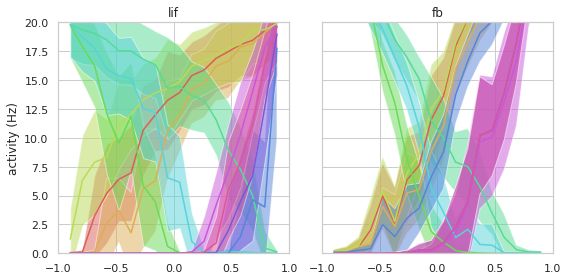

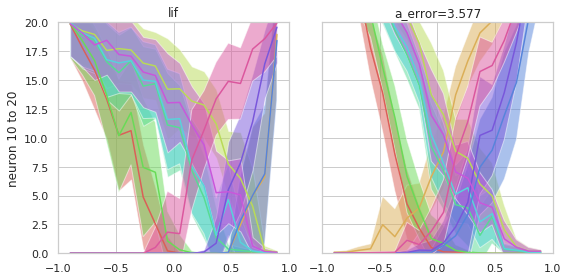

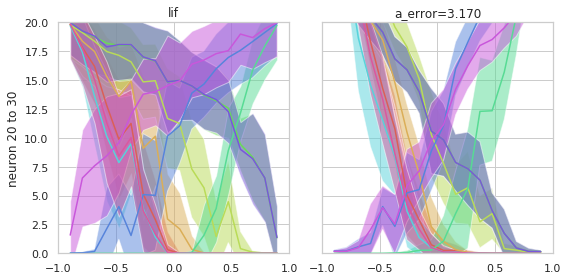

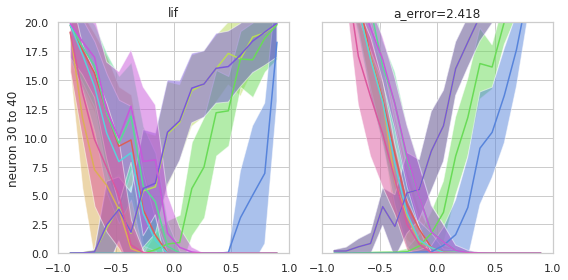

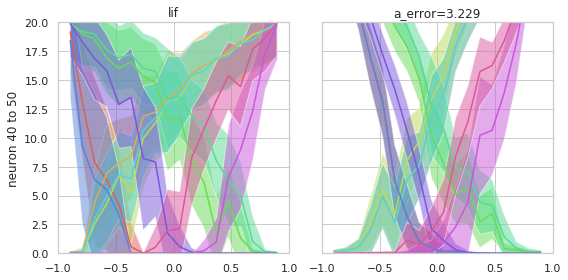

...

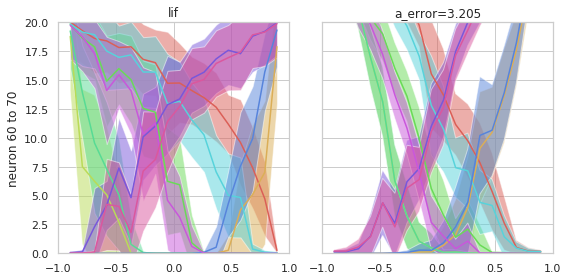

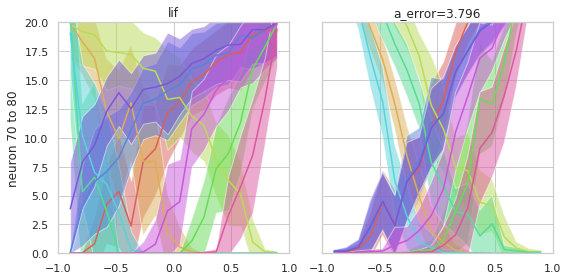

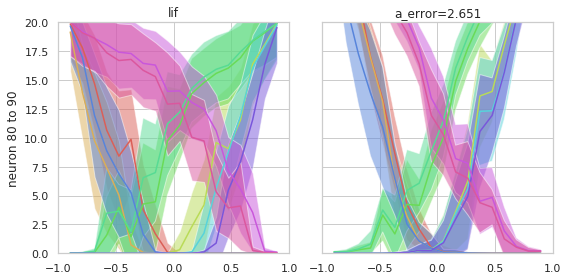

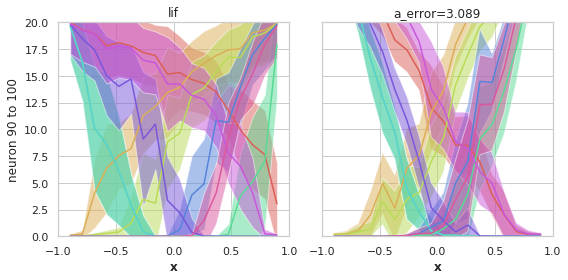

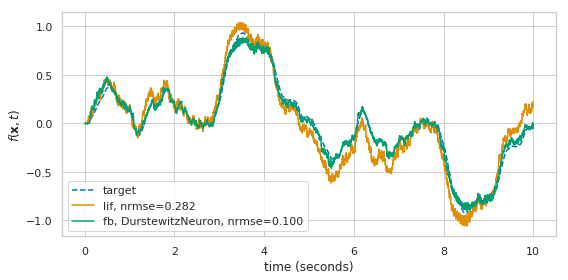

/home/pduggins/.virtualenvs/nbn/lib/python3.6/site-packages/scipy/stats/stats.py:1713: FutureWarning: Using a non-tuple sequence for multidimensional indexing is deprecated; use `arr[tuple(seq)]` instead of `arr[seq]`. In the future this will be interpreted as an array index, `arr[np.array(seq)]`, which will result either in an error or a different result.
  return np.add.reduce(sorted[indexer] * weights, axis=axis) / sumval


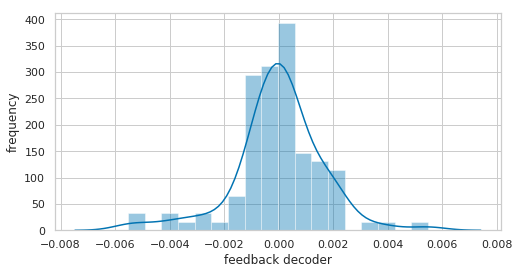

unsupervised simulation
estimating max_rates and intercepts from provided gain/bias...


/home/pduggins/.virtualenvs/nbn/lib/python3.6/site-packages/ipykernel_launcher.py:48: RuntimeWarning: divide by zero encountered in double_scalars


HtmlProgressBar cannot be displayed. Please use the TerminalProgressBar. It can be enabled with `nengo.rc.set('progress', 'progress_bar', 'nengo.utils.progress.TerminalProgressBar')`.

/home/pduggins/nengo/nengo/builder/ensemble.py:97: NengoWarning: Specifying the gains and biases for <Ensemble "fb"> imposes a set of maximum firing rates and intercepts. Further specifying either max_rates or intercepts has no effect.
  "either max_rates or intercepts has no effect." % ens))


max rates [22. 20. 22. 19. 20. 19. 21. 14. 18. 14. 18. 21. 22. 18. 20. 20. 10. 14.
 21. 17. 18. 19. 20. 19. 18. 17. 20. 19. 19. 18. 18. 14. 20. 18. 19. 16.
 13. 20. 17. 13. 14. 22. 23. 20. 22. 22. 14. 18. 14. 17. 19. 21. 22. 22.
 14. 21. 18. 22. 20. 22. 24. 13. 14. 19. 14. 22. 14. 22. 17. 21. 22. 17.
 22. 18. 21. 14. 20. 20. 18. 13. 18. 14. 17. 20. 20. 18. 15. 14. 22. 21.
 20. 22. 20. 14. 13. 14. 18. 17. 22. 18.]
intercepts [-0.6 -0.3 -0.9  0.2 -0.7 -0.1 -0.2  0.3  0.2  0.3  0.2 -0.2 -0.7  0.2
 -0.2 -0.3  0.4  0.3 -0.4  0.1  0.2  0.1 -0.3 -0.9  0.2  0.2 -0.3 -0.9
 -0.9  0.2  0.2  0.3 -0.3  0.1  0.2  0.2  0.3 -0.3  0.2  0.3  0.3 -0.6
 -0.9 -0.3 -0.5 -0.6  0.3  0.1  0.3  0.1 -0.9 -0.1 -0.6 -0.5  0.3 -0.2
  0.1 -0.5 -0.9 -0.6 -0.8  0.3  0.3  0.   0.3 -0.5  0.3 -0.5  0.1 -0.4
 -0.5  0.2 -0.5  0.2 -0.2  0.3 -0.7 -0.9  0.   0.3  0.2  0.3  0.2 -0.2
 -0.3  0.2  0.3  0.3 -0.6 -0.4 -0.9 -0.6 -0.2  0.3  0.3  0.3  0.2  0.1
 -0.7  0.2]
building  <Connection from <Ensemble "pre_u"> to <Ensemble "fb"

HtmlProgressBar cannot be displayed. Please use the TerminalProgressBar. It can be enabled with `nengo.rc.set('progress', 'progress_bar', 'nengo.utils.progress.TerminalProgressBar')`.

nonzero fb 99


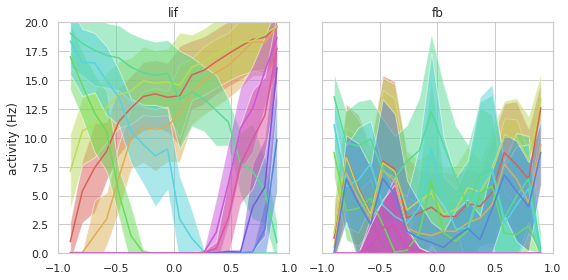

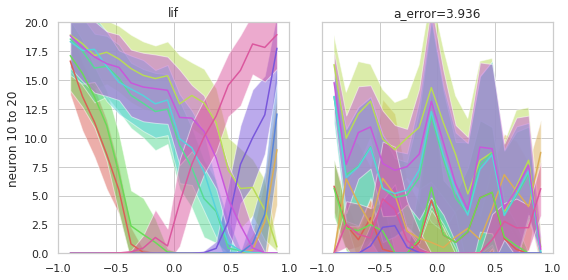

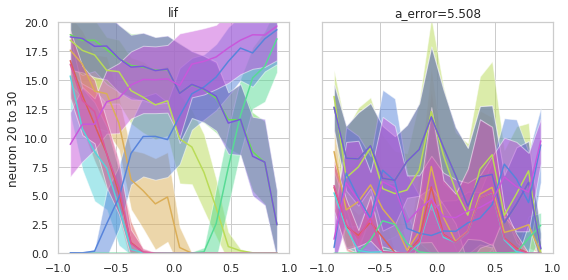

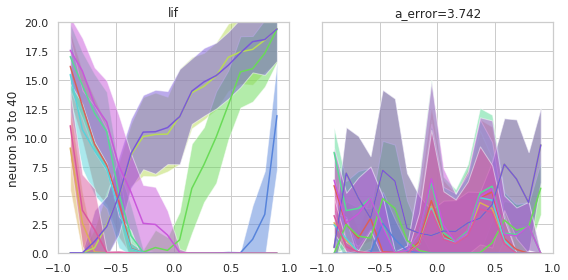

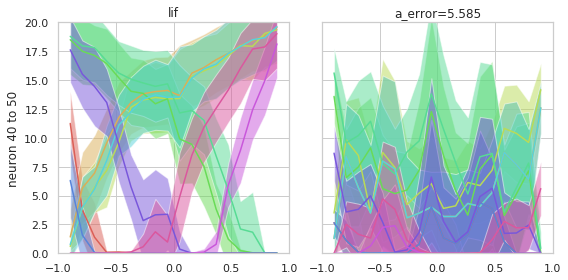

...

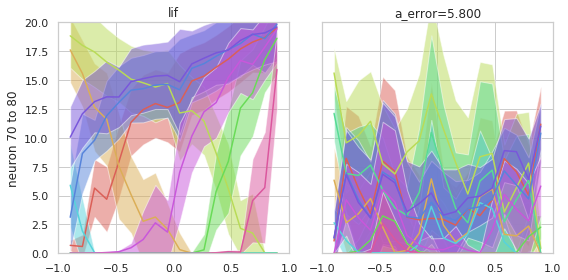

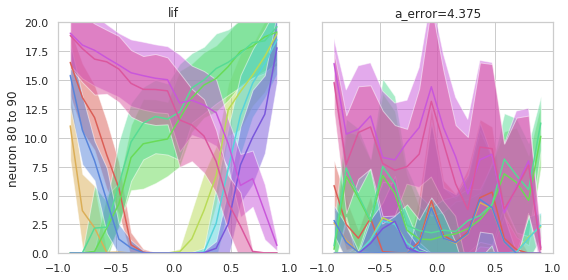

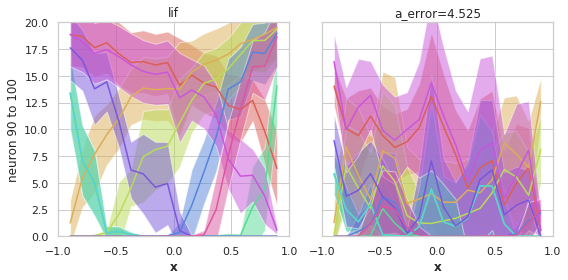

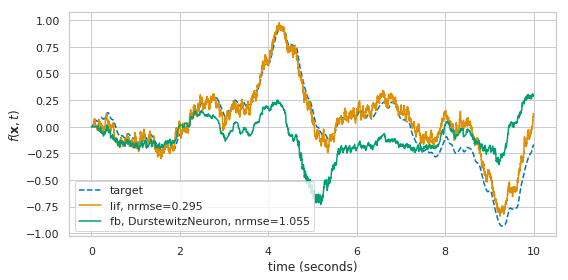

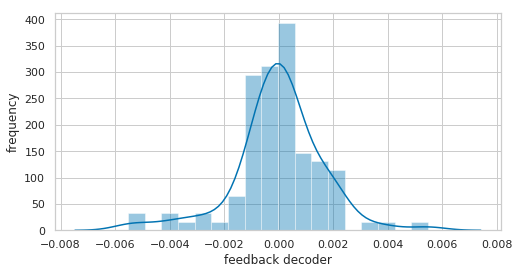

In [22]:
kwargs = dict(
    t=10,
    dt=0.001,
    dt_sample=0.001,
    n_neurons=100,
    freq=10,
    max_rates=Uniform(20, 20),
    intercepts=Uniform(-1, 1),
    neuron_type=DurstewitzNeuron(DA=False, k_weight=4e2),
    taus={'network': 0.1, 'readout': 0.1},
    seeds={'ns': 1, 'ss':2, 'es': 3, 'cs': 4, 'ls': 5},
    lambda_d=1e-1,
    lambda_c=1e-1,
    order=2,
    n_samples=10000,
    mean_taus=[0.001, 0.1],
    std_taus=[0.0001, 0.01],
    signal='white_noise')

d_fb, h, datadict_train, datadict_test = run_once(optimize_h=True, **kwargs)